# Projector-Camera Calibration  
Xiao Wang  
xwang3@arizona.edu

# Libraries & System Parameters

In [ ]:
import cv2
import numpy as np
import os, sys
import shutil
import glob
import re
from tqdm.auto import tqdm
import json
import matplotlib.pyplot as plt
import calib_recon_utils as utils
%load_ext autoreload
%autoreload 2

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [ ]:
print("OpenCV version:", cv2.__version__)
print("NumPy version:", np.__version__)

%matplotlib inline
plt.style.use('default')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.rm'] = 'Times New Roman'
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams.update({'font.size': 10}) 
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['image.cmap'] = 'gray'

%reload_ext autoreload

--- Setup ---
OpenCV version: 4.12.0
NumPy version: 2.2.6
---------------------



In [ ]:
checkerboard_size = (12, 9)  # Number of inner corners of a Checkerboard
# Size of a Checkerboard square in real-world units (e.g., mm, cm, inches).
SQUARE_SIZE = 10.0  # [mm]

Padding the camera images before calibration does not change the true extrinsic geometry between the camera and projector.  
It only redefines the pixel coordinate system — shifting the camera’s principal point by the padding amount.  
As long as every later step (GrayCode decoding, reprojection, reconstruction) uses the same padded coordinate convention, your calibration remains perfectly valid.

# load Calibration Images

In [ ]:
# set root directory
folder_name = "12192025"
root_dir = r"../calibration_capture/" + folder_name
target_dir = os.path.join(root_dir, "camera_calibration_images")

# SET THIS TO THE PATH OF YOUR LOCAL IMAGE DIRECTORY
image_directory = target_dir
os.makedirs(target_dir, exist_ok=True)

# iterate through all subfolders in the root directory
for name in os.listdir(root_dir):
    subfolder = os.path.join(root_dir, name)
    if os.path.isdir(subfolder) and name.isdigit():
        src_img = os.path.join(subfolder, "00_00.png")
        if os.path.isfile(src_img):
            new_name = f"{name}_00_00.png"
            dst_img = os.path.join(target_dir, new_name)
            shutil.copy2(src_img, dst_img)
            print(f"Copied: {src_img} -> {dst_img}")

Copied: ./calibration_capture/12192025\1\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\1_00_00.png
Copied: ./calibration_capture/12192025\10\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\10_00_00.png
Copied: ./calibration_capture/12192025\11\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\11_00_00.png
Copied: ./calibration_capture/12192025\12\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\12_00_00.png
Copied: ./calibration_capture/12192025\13\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\13_00_00.png
Copied: ./calibration_capture/12192025\14\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\14_00_00.png
Copied: ./calibration_capture/12192025\15\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\15_00_00.png
Copied: ./calibration_capture/12192025\16\00_00.png -> ./calibration_capture/12192025\camera_calibration_images\16_00_00.png
Co

In [ ]:
print("--- Image Loading ---")

print(f"Attempting to load calibration images from: {image_directory}")
print("Need at least 10-20 images from different angles and distances.")

if not os.path.isdir(image_directory):
    print(f"\nError: Directory not found: '{image_directory}'")
    print(
        "Please verify the 'image_directory' variable points to the correct location."
    )
    exit()

supported_extensions = ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.tif", "*.tiff"]
image_filenames = []
print(f"Searching for files with extensions: {', '.join(supported_extensions)}")
for ext in supported_extensions:
    pattern = os.path.join(image_directory, ext)
    found_files = glob.glob(pattern)
    image_filenames.extend(found_files)

if not image_filenames:
    print(f"\nError: No supported image files found in '{image_directory}'.")
    print("Please check the directory content and the specified path.")
    exit()
else:
    print(
        f"\nSuccessfully found {len(image_filenames)} potential calibration image(s)."
    )

    # Sort the filenames numerically 
    print("Sorting image filenames by number found in name...")
    # Use the custom extract_number function as the key for sorting
    image_filenames.sort(key=utils.extract_number)
    # End of sorting 

    print("Sorted file list (showing first few):")
    for i, filename in enumerate(
        image_filenames[:20]
    ):  # Show first 20 sorted filenames
        print(f"- {os.path.basename(filename)}")
    if len(image_filenames) > 20:
        print("  ...")
        print(f"- {os.path.basename(image_filenames[-1])} (last file)")
    print("---------------------\n")
    print("Starting calibration process using sorted local images...")

--- Image Loading ---
Attempting to load calibration images from: ./calibration_capture/12192025\camera_calibration_images
Need at least 10-20 images from different angles and distances.
Searching for files with extensions: *.jpg, *.jpeg, *.png, *.bmp, *.tif, *.tiff

Successfully found 29 potential calibration image(s).
Sorting image filenames by number found in name...
Sorted file list (showing first few):
- 1_00_00.png
- 2_00_00.png
- 3_00_00.png
- 4_00_00.png
- 5_00_00.png
- 6_00_00.png
- 7_00_00.png
- 8_00_00.png
- 9_00_00.png
- 10_00_00.png
- 11_00_00.png
- 12_00_00.png
- 13_00_00.png
- 14_00_00.png
- 15_00_00.png
- 16_00_00.png
- 17_00_00.png
- 18_00_00.png
- 19_00_00.png
- 20_00_00.png
  ...
- 29_00_00.png (last file)
---------------------

Starting calibration process using sorted local images...


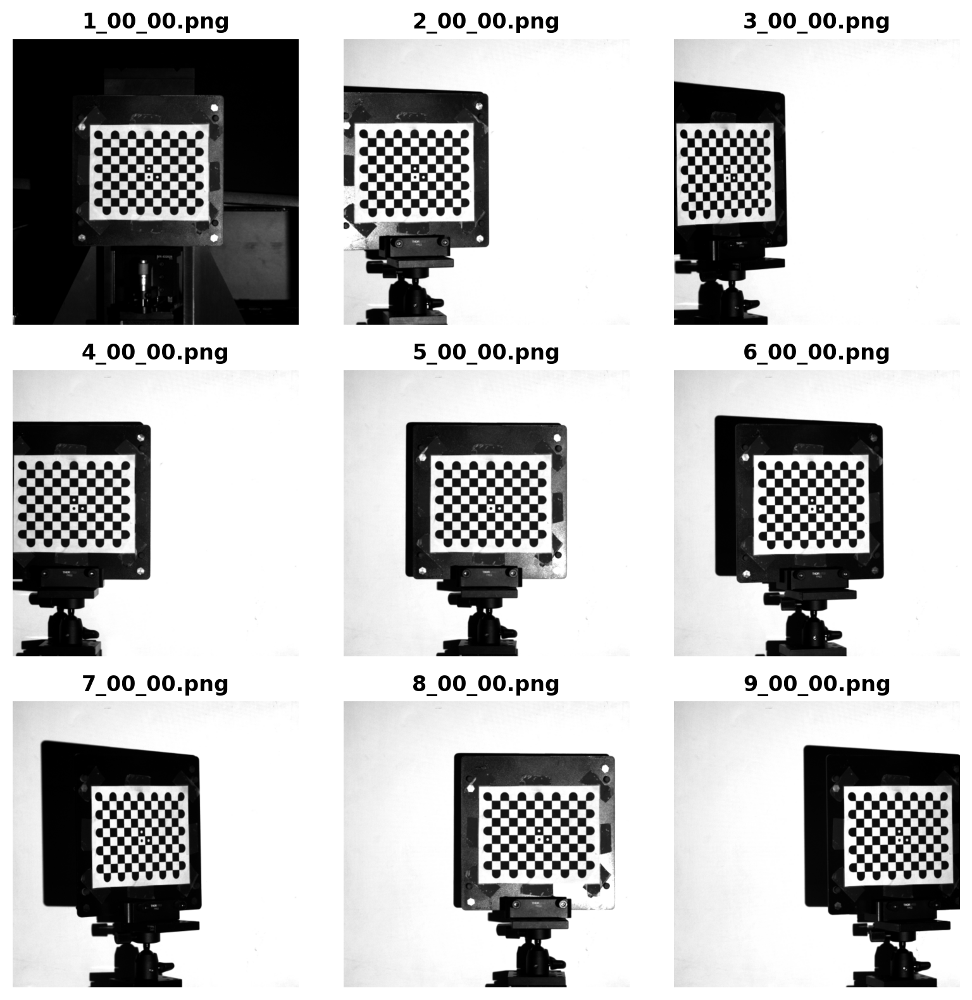

In [ ]:
# Now, 'image_filenames' contains the full paths, sorted numerically based on numbers in the filename.
plt.figure(figsize=(8, 8))
for i, filename in enumerate(image_filenames[:9]):  # Show first 9 images
    img = cv2.imread(filename, 0)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(os.path.basename(filename))
plt.tight_layout()
plt.show()

In [7]:
img.shape

(928, 928)

# Prepare Object Points and Image Points


--- Configuration ---
Checkerboard inner corners: 12 x 9
Checkerboard square size: 10.0 units
---------------------


--- Corner Detection ---


  0%|          | 0/29 [00:00<?, ?it/s]

Processing ./calibration_capture/12192025\camera_calibration_images\1_00_00.png...
  Detected image size: 928 x 928
  ✅ Checkerboard corners found.


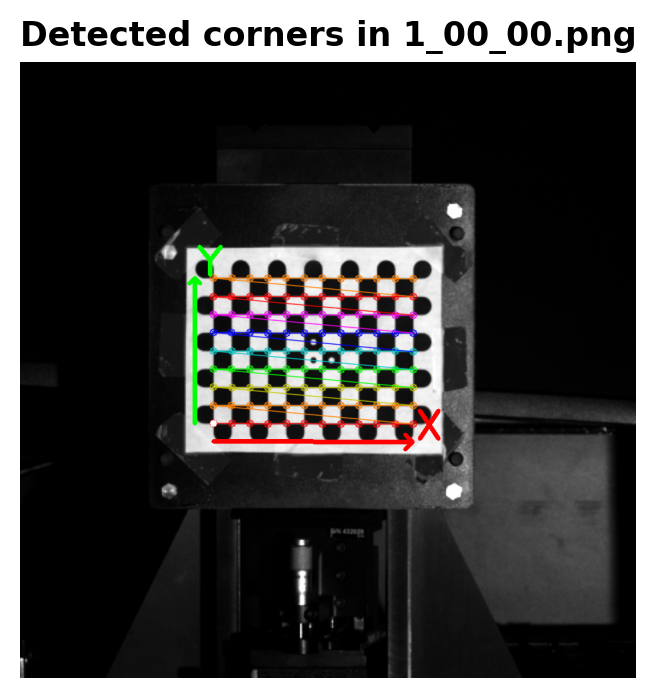

Processing ./calibration_capture/12192025\camera_calibration_images\2_00_00.png...
  ✅ Checkerboard corners found.


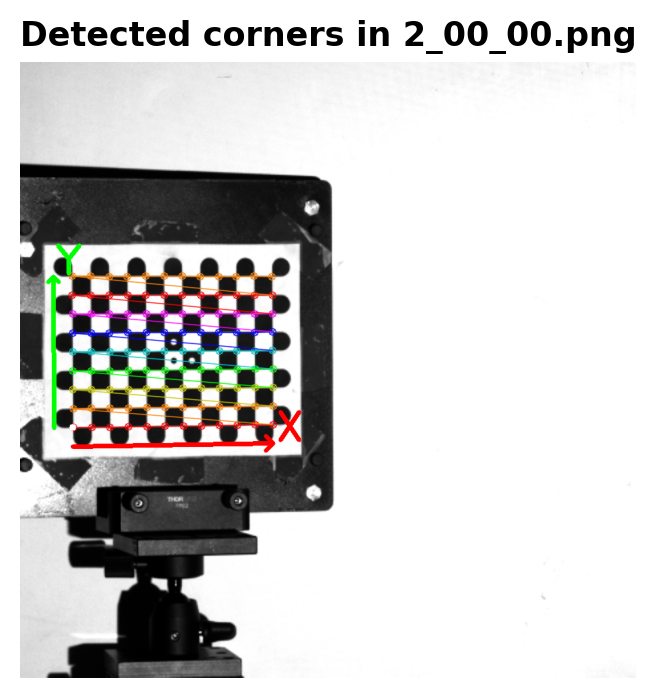

Processing ./calibration_capture/12192025\camera_calibration_images\3_00_00.png...
  ✅ Checkerboard corners found.


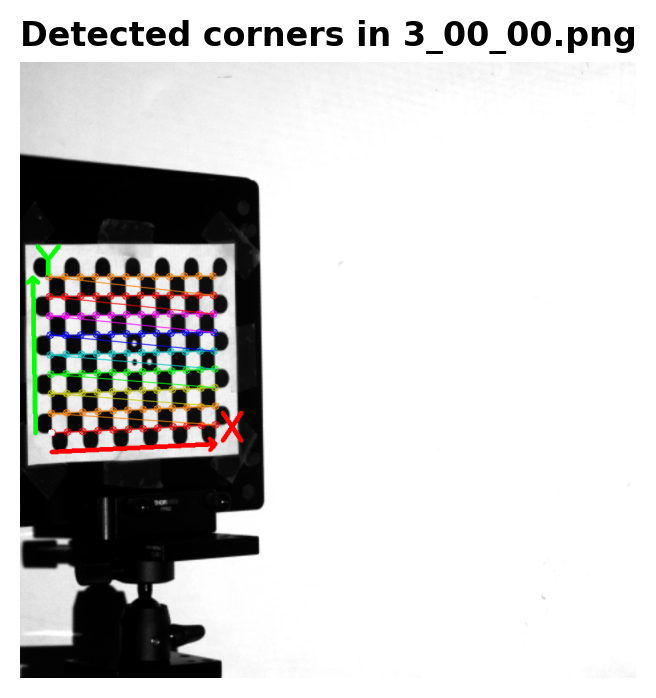

Processing ./calibration_capture/12192025\camera_calibration_images\4_00_00.png...
  ✅ Checkerboard corners found.


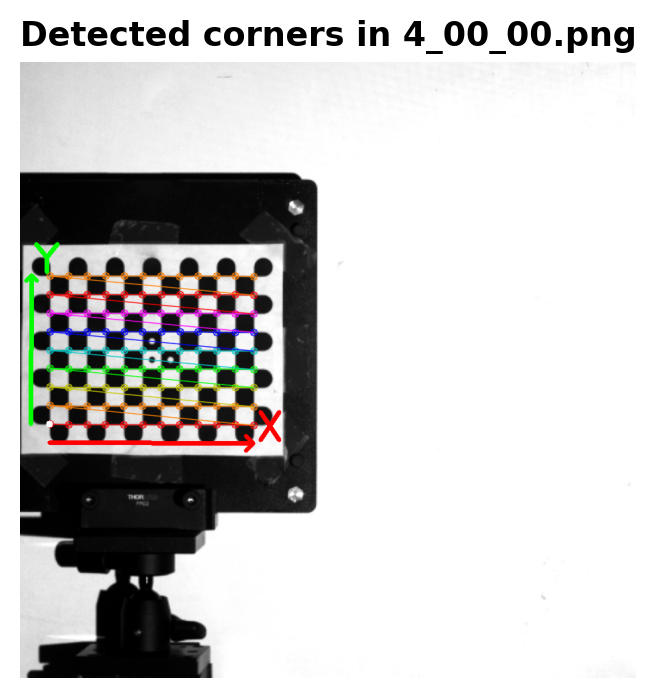

Processing ./calibration_capture/12192025\camera_calibration_images\5_00_00.png...
  ✅ Checkerboard corners found.


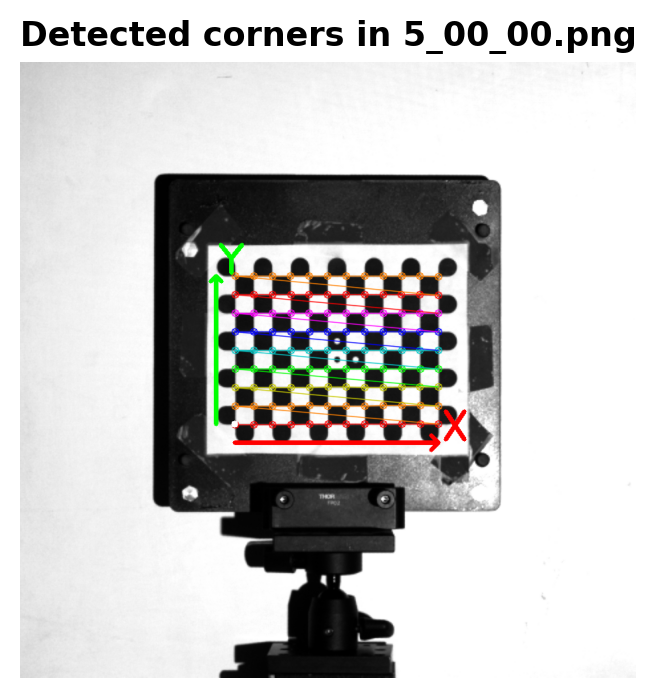

Processing ./calibration_capture/12192025\camera_calibration_images\6_00_00.png...
  ✅ Checkerboard corners found.


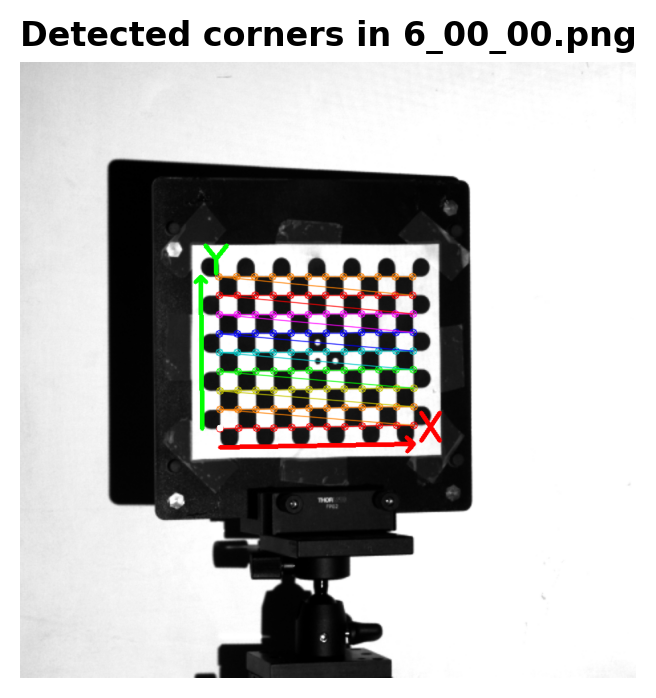

Processing ./calibration_capture/12192025\camera_calibration_images\7_00_00.png...
  ✅ Checkerboard corners found.


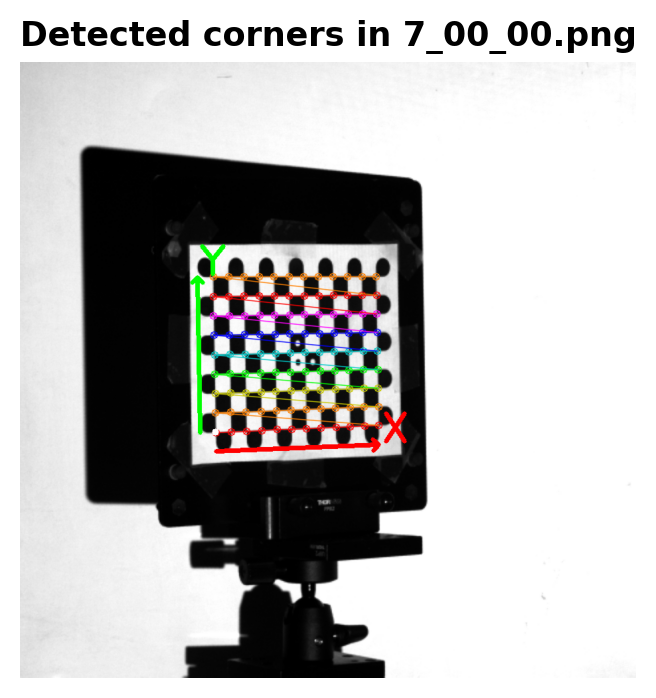

Processing ./calibration_capture/12192025\camera_calibration_images\8_00_00.png...
  ✅ Checkerboard corners found.


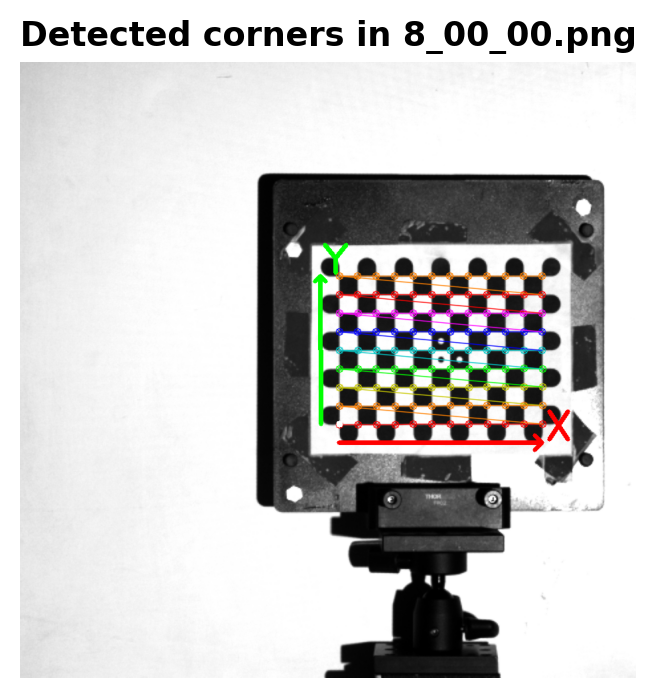

Processing ./calibration_capture/12192025\camera_calibration_images\9_00_00.png...
  ✅ Checkerboard corners found.


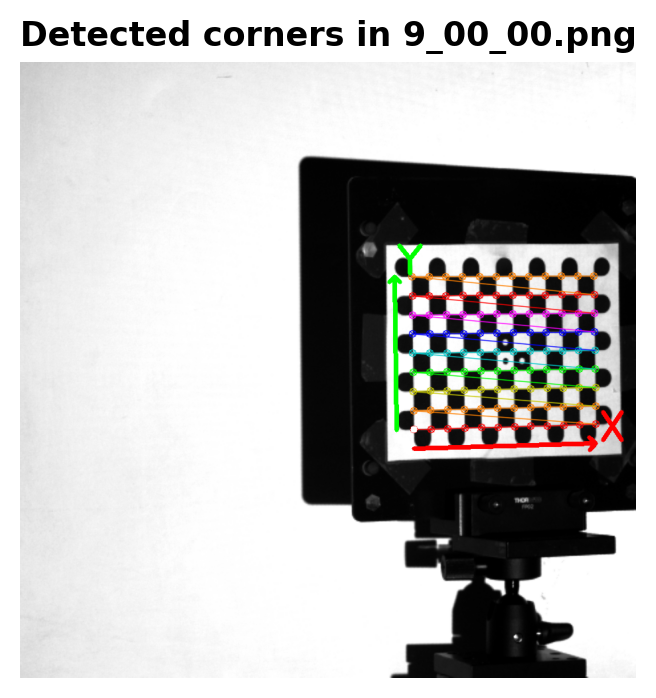

Processing ./calibration_capture/12192025\camera_calibration_images\10_00_00.png...
  ✅ Checkerboard corners found.


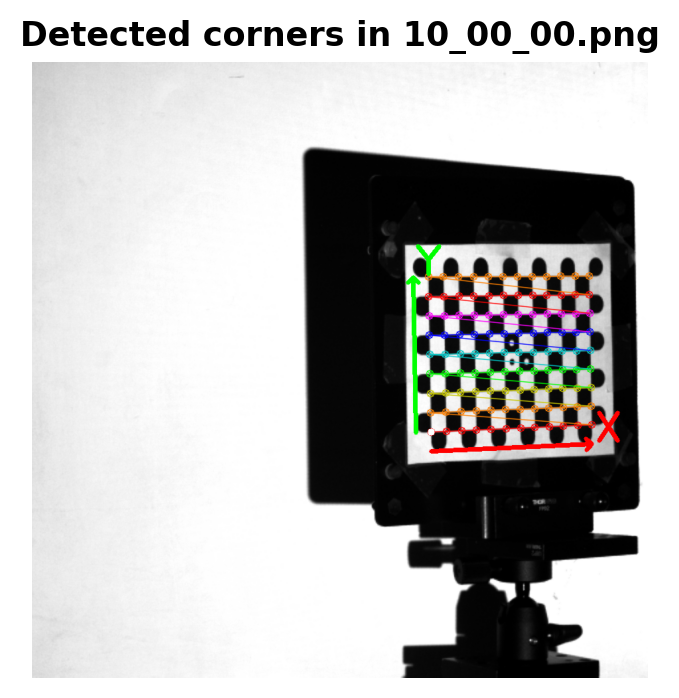

Processing ./calibration_capture/12192025\camera_calibration_images\11_00_00.png...
  ✅ Checkerboard corners found.


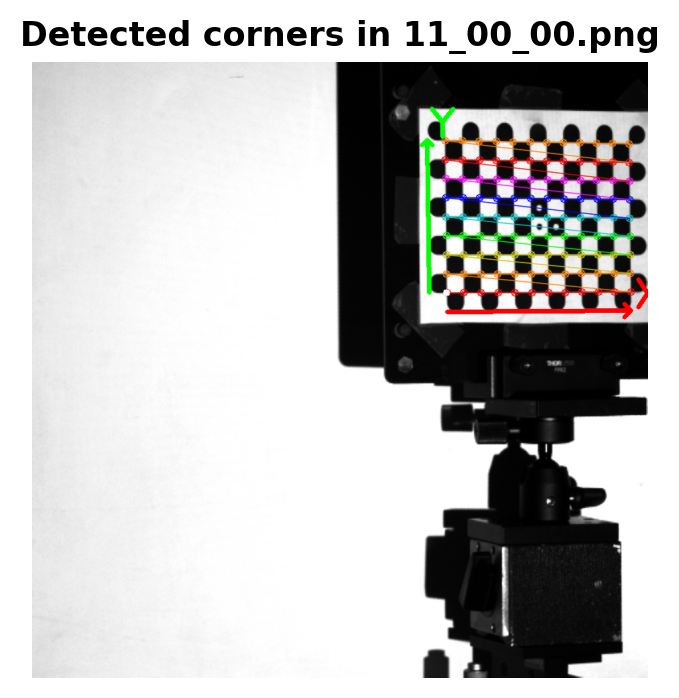

Processing ./calibration_capture/12192025\camera_calibration_images\12_00_00.png...
  ✅ Checkerboard corners found.


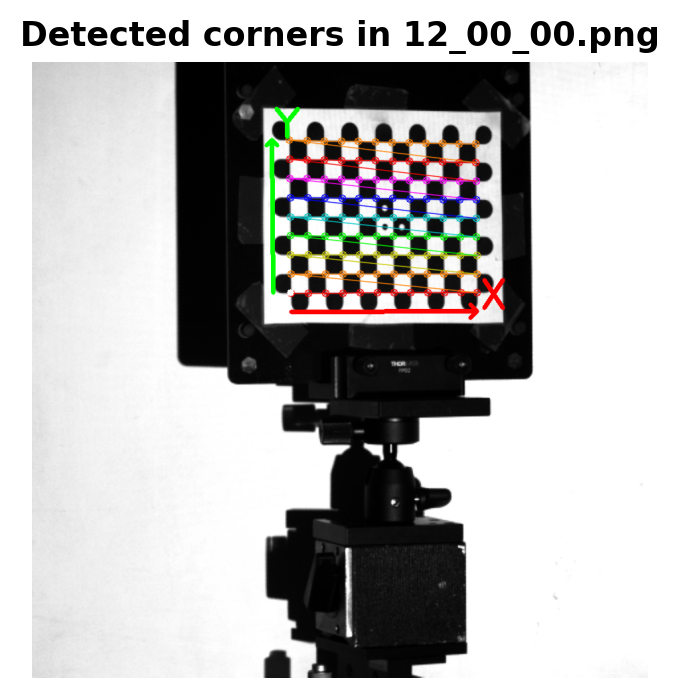

Processing ./calibration_capture/12192025\camera_calibration_images\13_00_00.png...
  ✅ Checkerboard corners found.


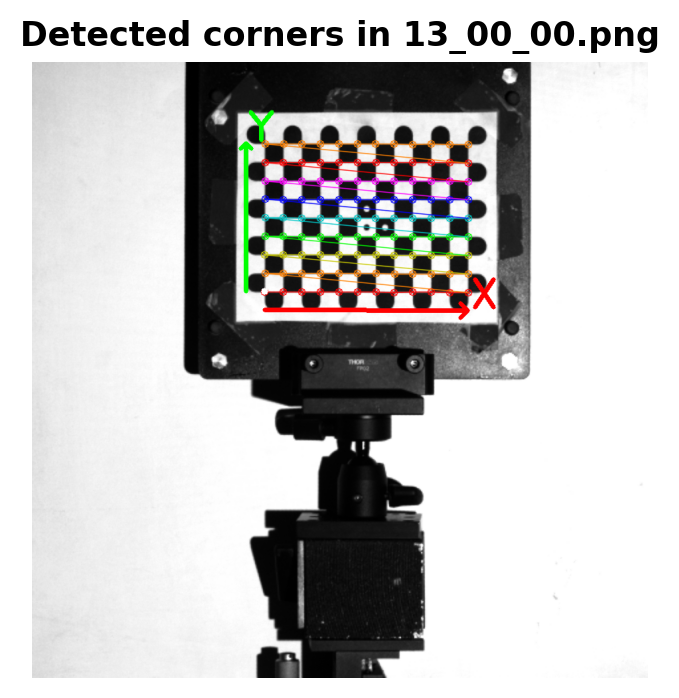

Processing ./calibration_capture/12192025\camera_calibration_images\14_00_00.png...
  ✅ Checkerboard corners found.


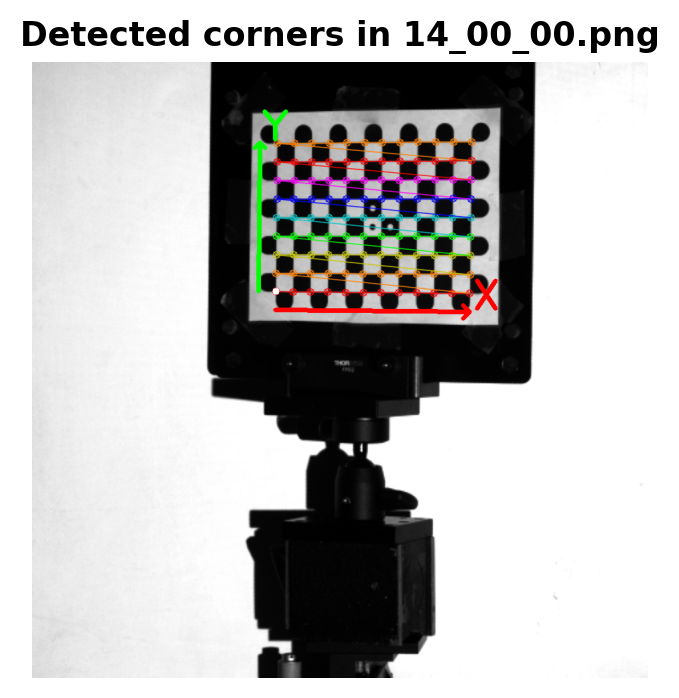

Processing ./calibration_capture/12192025\camera_calibration_images\15_00_00.png...
  ✅ Checkerboard corners found.


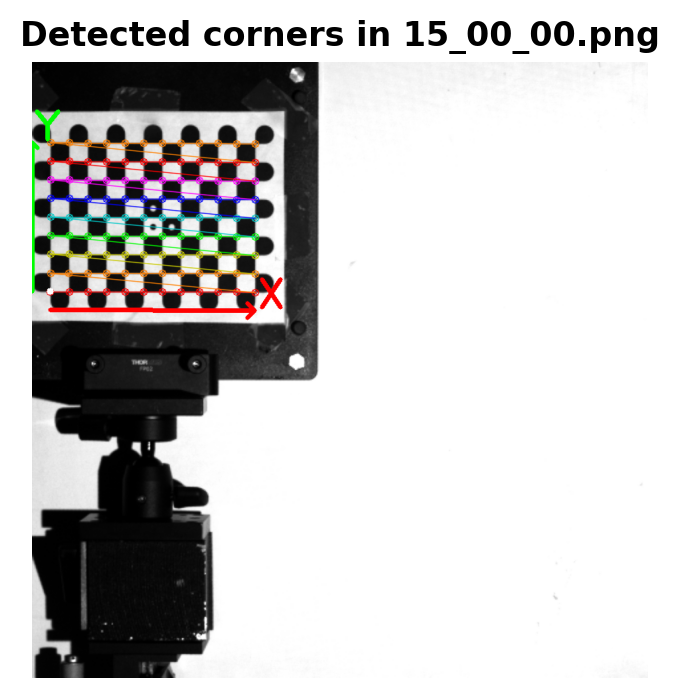

Processing ./calibration_capture/12192025\camera_calibration_images\16_00_00.png...
  ✅ Checkerboard corners found.


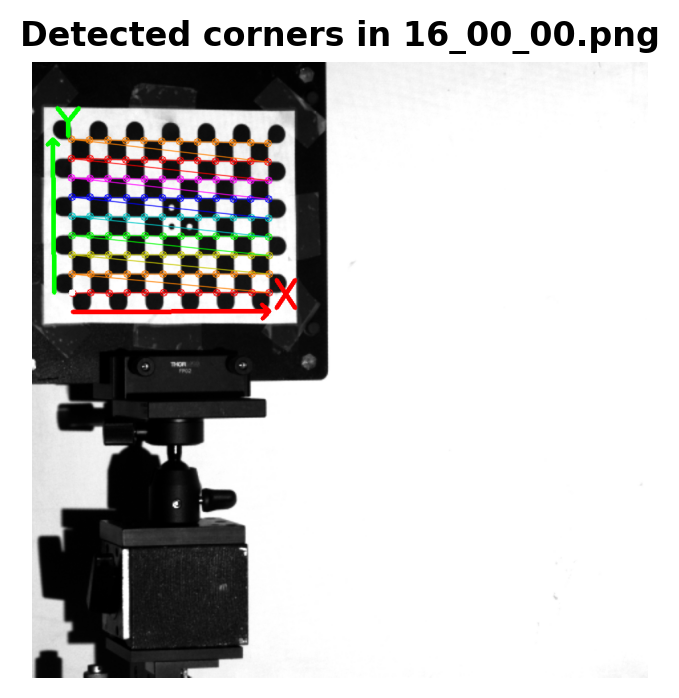

Processing ./calibration_capture/12192025\camera_calibration_images\17_00_00.png...
  ✅ Checkerboard corners found.


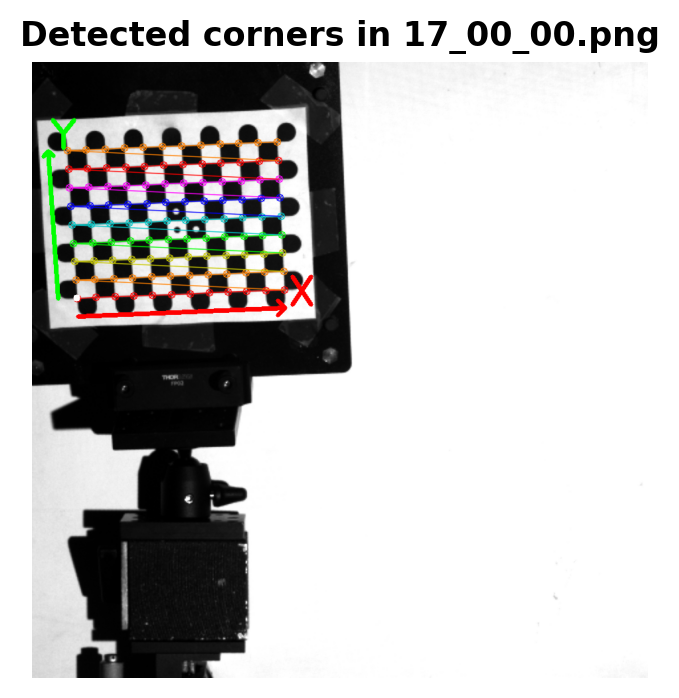

Processing ./calibration_capture/12192025\camera_calibration_images\18_00_00.png...
  ✅ Checkerboard corners found.


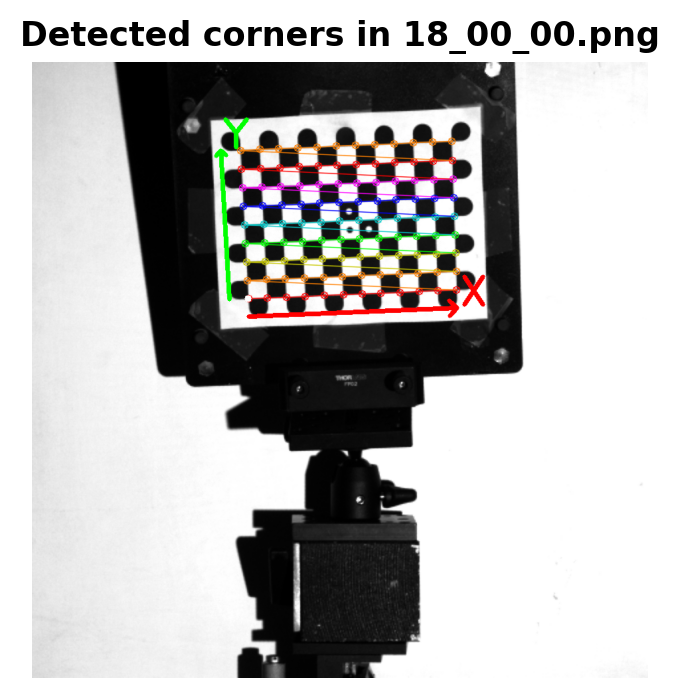

Processing ./calibration_capture/12192025\camera_calibration_images\19_00_00.png...
  ✅ Checkerboard corners found.


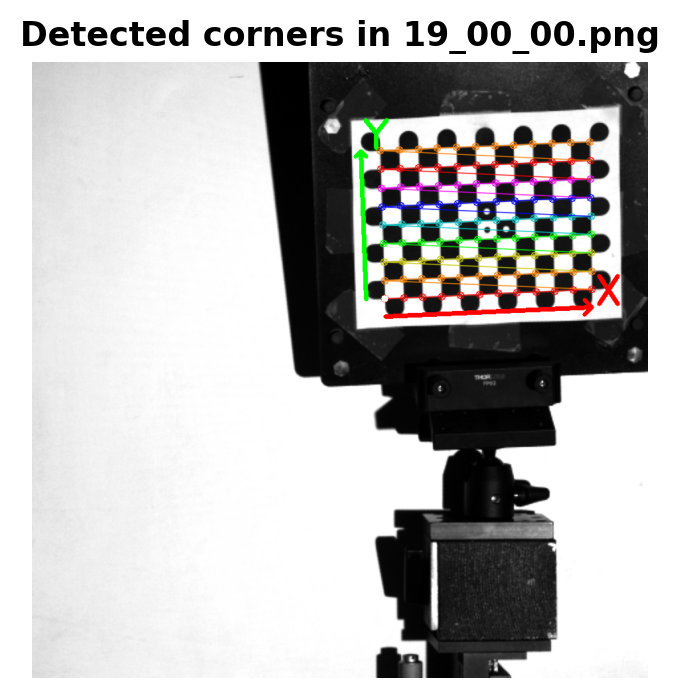

Processing ./calibration_capture/12192025\camera_calibration_images\20_00_00.png...
  ✅ Checkerboard corners found.


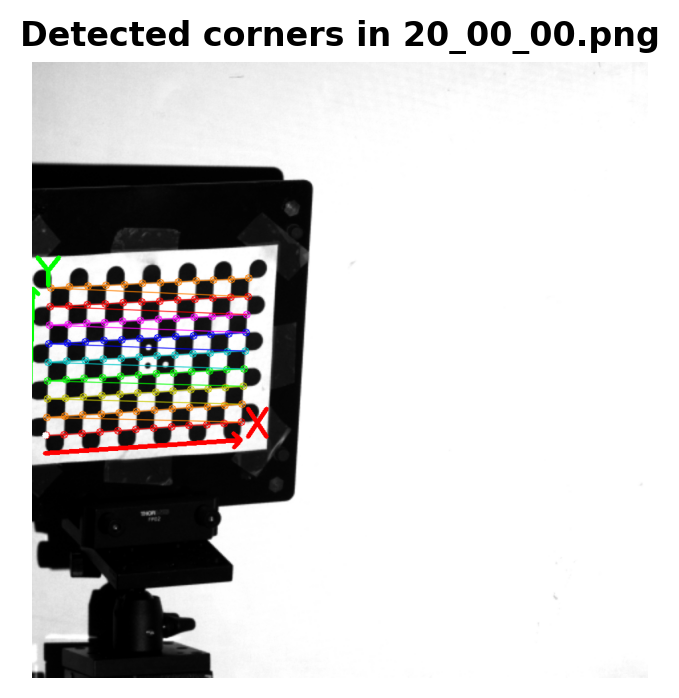

Processing ./calibration_capture/12192025\camera_calibration_images\21_00_00.png...
  ✅ Checkerboard corners found.


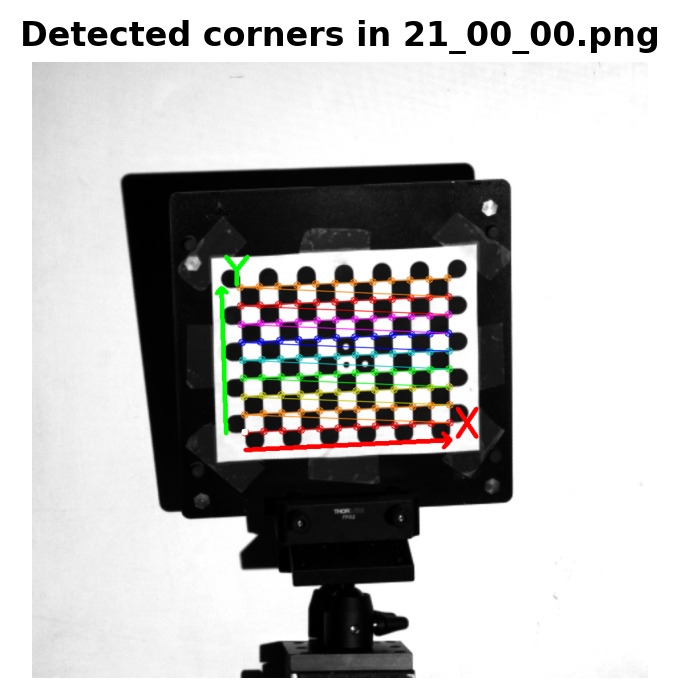

Processing ./calibration_capture/12192025\camera_calibration_images\22_00_00.png...
  ✅ Checkerboard corners found.


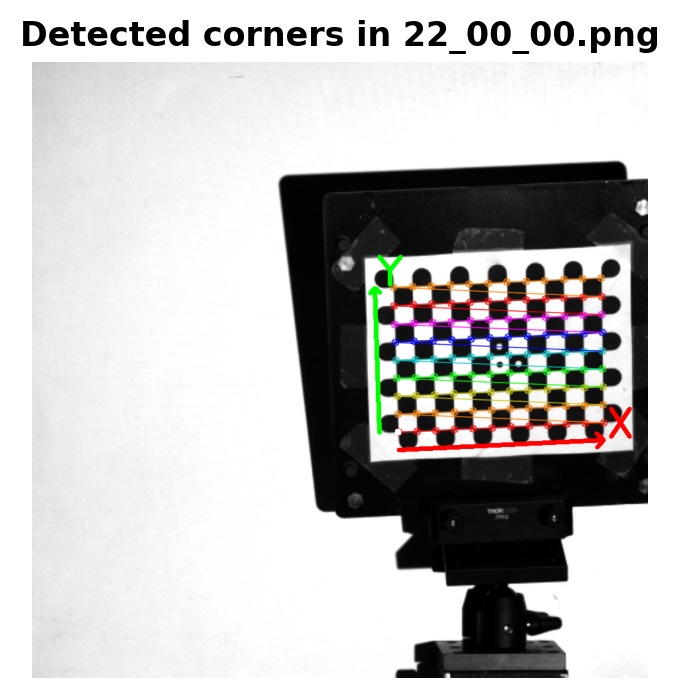

Processing ./calibration_capture/12192025\camera_calibration_images\23_00_00.png...
  ✅ Checkerboard corners found.


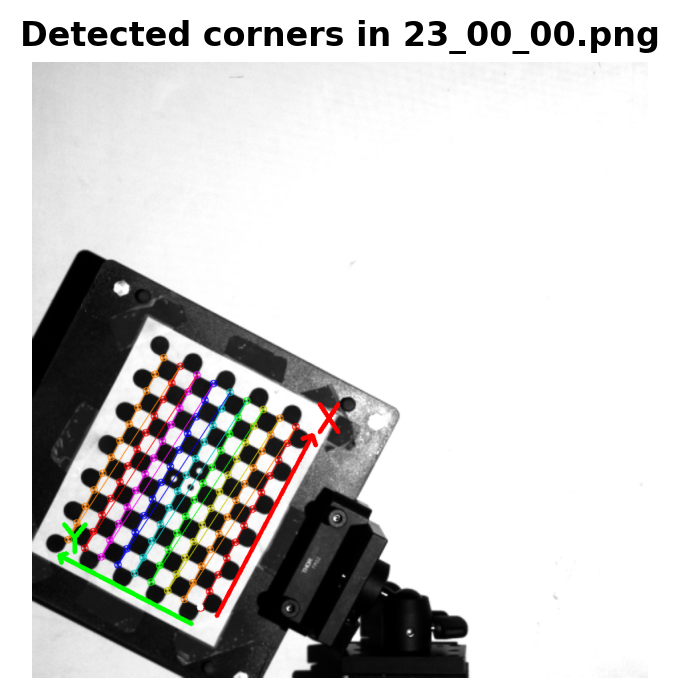

Processing ./calibration_capture/12192025\camera_calibration_images\24_00_00.png...
  ✅ Checkerboard corners found.


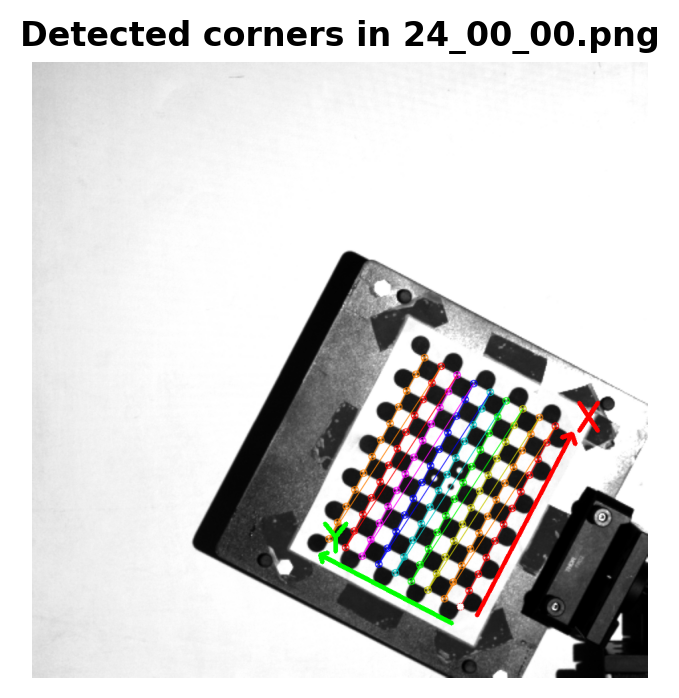

Processing ./calibration_capture/12192025\camera_calibration_images\25_00_00.png...
  ✅ Checkerboard corners found.


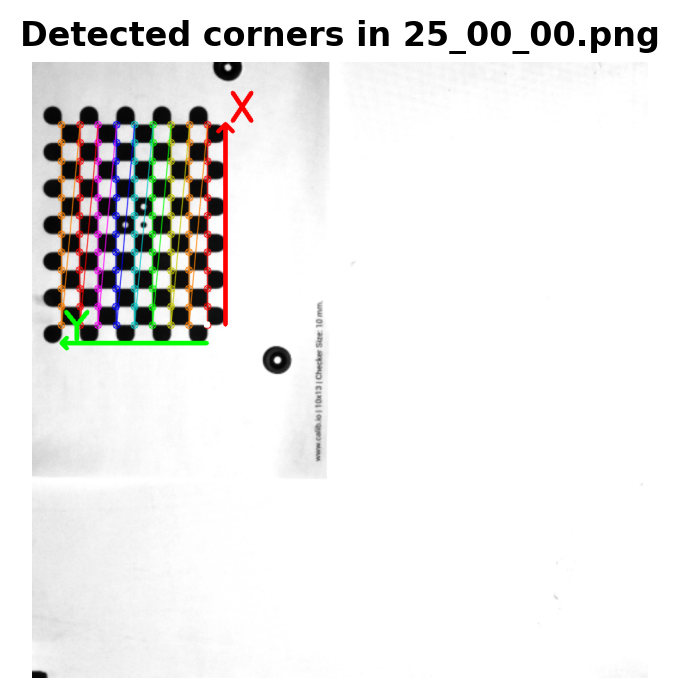

Processing ./calibration_capture/12192025\camera_calibration_images\26_00_00.png...
  ✅ Checkerboard corners found.


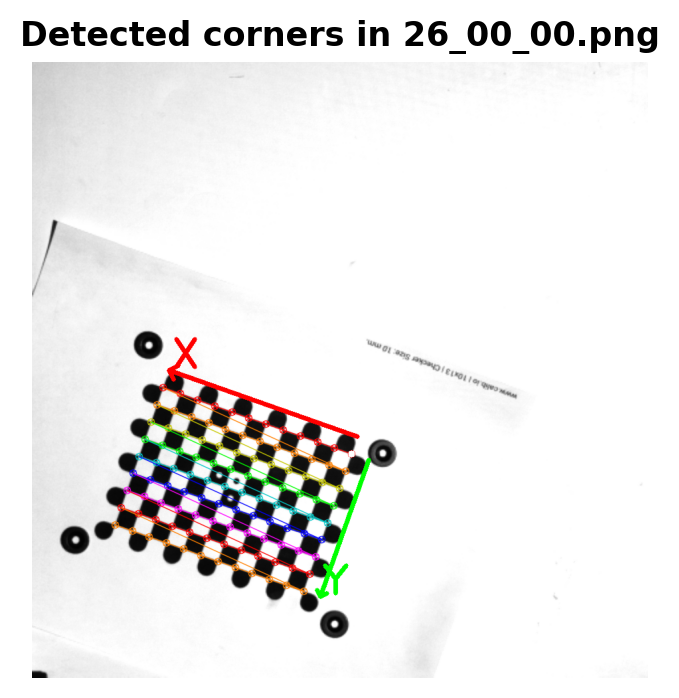

Processing ./calibration_capture/12192025\camera_calibration_images\27_00_00.png...
  ✅ Checkerboard corners found.


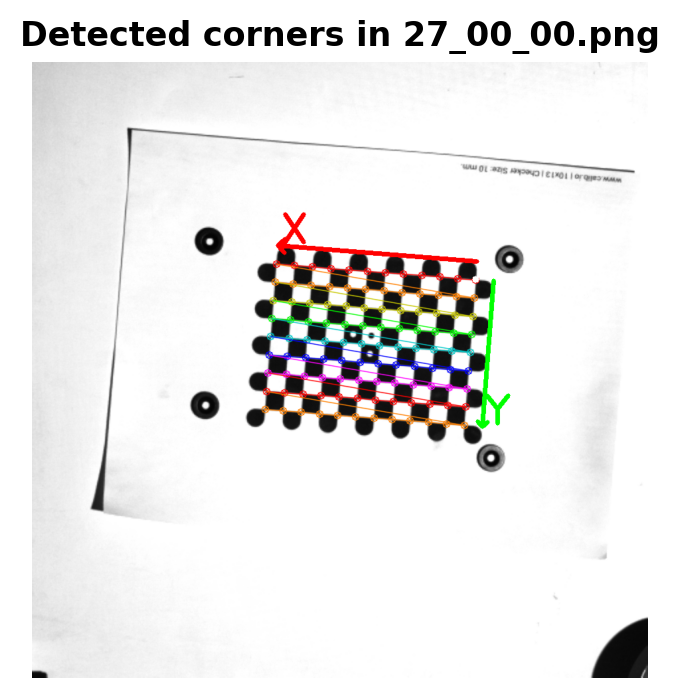

Processing ./calibration_capture/12192025\camera_calibration_images\28_00_00.png...
  ✅ Checkerboard corners found.


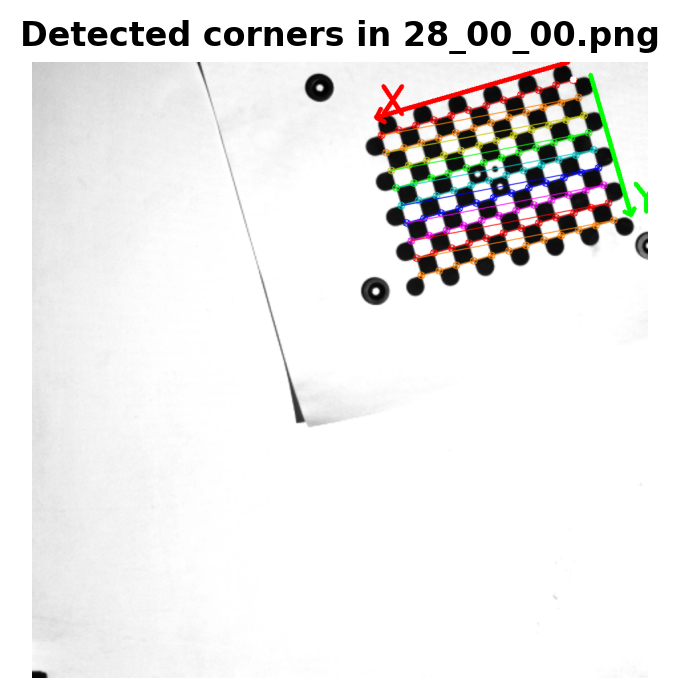

Processing ./calibration_capture/12192025\camera_calibration_images\29_00_00.png...
  ✅ Checkerboard corners found.


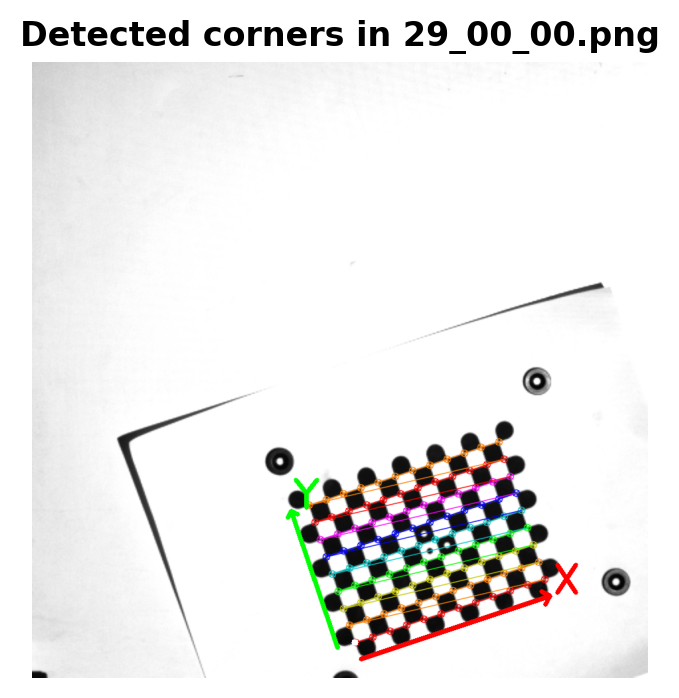


Finished processing 29 images.
Found Checkerboard corners in 29 images.
---------------------



In [8]:
print("--- Configuration ---")
print(f"Checkerboard inner corners: {checkerboard_size[0]} x {checkerboard_size[1]}")
print(f"Checkerboard square size: {SQUARE_SIZE} units")
print("---------------------\n")
print("\n--- Corner Detection ---")
# Termination criteria for corner refinement
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-6)

# Prepare object points like (0,0,0), (1,0,0), (2,0,0) ..., (W-1, H-1, 0)
# Multiply by SQUARE_SIZE to get real-world coordinates
objp = np.zeros((np.prod(checkerboard_size).astype(int), 3), np.float32)
objp[:, :2] = np.mgrid[0 : checkerboard_size[0], 0 : checkerboard_size[1]].T.reshape(
    -1, 2
)
objp = objp * SQUARE_SIZE
flags = None
# Arrays to store object points and image points from all the images.
objpoints = []  # 3d point in real world space
imgpoints = []  # 2d points in image plane.
image_size = None  # To store the image size (needed for calibration)
images_processed_count = 0
images_corners_found_count = 0
valid_image_filenames = []  # Keep track of images where corners were found
for fname in tqdm(image_filenames):
    print(f"Processing {fname}...")
    images_processed_count += 1
    try:
        img = cv2.imread(
            fname, cv2.IMREAD_GRAYSCALE
        )  # Use cv2.imread directly on the filename
        # Get image size (only need to do this once)
        if image_size is None:
            image_size = img.shape[::-1]  # Get (width, height)
            print(f"  Detected image size: {image_size[0]} x {image_size[1]}")
        # Find the chess board corners
        # Flags can sometimes help, e.g., cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE
        flags = cv2.CALIB_CB_EXHAUSTIVE | cv2.CALIB_CB_ACCURACY | cv2.CALIB_CB_MARKER
        ret, corners = cv2.findChessboardCornersSB(
            img,
            checkerboard_size,
            corners=None,
            flags=flags,
        )
        # If found, add object points, image points (after refining them)
        if ret == True:
            images_corners_found_count += 1
            print(f"  ✅ Checkerboard corners found.")
            objpoints.append(objp)
            valid_image_filenames.append(fname)  # Add to valid list
            # Refine corner locations
            corners2 = cv2.cornerSubPix(img, corners, (7, 7), (-1, -1), criteria)
            imgpoints.append(corners2)
            img_BGR = cv2.cvtColor(
                img, cv2.COLOR_GRAY2BGR
            )  # Convert to color for drawing
            cv2.drawChessboardCorners(img_BGR, checkerboard_size, corners2, ret)
            # 3. calculate Checkerboard coordinate system origin and X/Y axis endpoints in image pixel coordinates
            origin = corners2[0, 0]  # first point: (0,0)
            # original x axis and y axis step vectors
            step_x = corners2[1, 0] - origin  # from (0,0) to (1,0)
            step_y = corners2[checkerboard_size[0], 0] - origin  # from (0,0) to (0,1)
            # endpoint first taken by the original logic
            x_axis_pt = corners2[checkerboard_size[0] - 1, 0]  # (1,0)
            y_axis_pt = corners2[
                int(checkerboard_size[0] * (checkerboard_size[1] - 1)), 0
            ]  # (0,1)
            # then do translation: X axis along -Y direction, Y axis along -X direction
            x_origin = origin - step_y  # point (1,0) position
            y_origin = origin - step_x
            x_axis_pt = x_axis_pt - step_y
            y_axis_pt = y_axis_pt - step_x
            # 4. Draw arrows on the image to indicate X and Y axes
            #    Red represents X axis, green represents Y axis
            x_origin_int = tuple(x_origin.astype(int))
            y_origin_int = tuple(y_origin.astype(int))
            x_end_int = tuple(x_axis_pt.astype(int))
            y_end_int = tuple(y_axis_pt.astype(int))
            cv2.arrowedLine(
                img_BGR, x_origin_int, x_end_int, (0, 0, 255), 5, tipLength=0.05
            )
            cv2.putText(
                img_BGR,
                "X",
                (x_end_int[0] + 5, x_end_int[1] - 5),
                cv2.FONT_HERSHEY_SIMPLEX,
                2,
                (0, 0, 255),
                5,
            )
            cv2.arrowedLine(
                img_BGR, y_origin_int, y_end_int, (0, 255, 0), 5, tipLength=0.05
            )
            cv2.putText(
                img_BGR,
                "Y",
                (y_end_int[0] + 5, y_end_int[1] - 5),
                cv2.FONT_HERSHEY_SIMPLEX,
                2,
                (0, 255, 0),
                5,
            )
            origin_int = tuple(origin.astype(int))
            cv2.circle(img_BGR, origin_int, 5, (255, 255, 255), -1)
            # 5. Convert to RGB and display using matplotlib
            img_RGB = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(4, 4))
            plt.imshow(img_RGB)
            plt.axis("off")
            plt.title(f"Detected corners in {os.path.basename(fname)}")
            plt.show()
        else:
            print(
                f"  ❌ Warning: Checkerboard corners NOT found in {fname}. Skipping this image for calibration."
            )
    except Exception as e:
        print(f"  Error processing {fname}: {e}. Skipping.")

print(f"\nFinished processing {images_processed_count} images.")
print(f"Found Checkerboard corners in {images_corners_found_count} images.")
print("---------------------\n")

if images_corners_found_count < 5:
    print("\nError: Not enough images with detected corners for reliable calibration.")
    print(
        f"Need at least 5, found {images_corners_found_count}. Please provide more/better images and run again."
    )
    exit()

# Perform Camera Calibration

In [9]:
image_size

(928, 928)

In [10]:
print("--- Calibration ---")
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-6)
flags = (
    cv2.CALIB_ZERO_TANGENT_DIST | cv2.CALIB_FIX_K3 | cv2.CALIB_FIX_K2 | cv2.CALIB_FIX_K1
)

print("Performing camera calibration...")
# Check if image_size was set
if image_size is None:
    print(
        "\nError: Could not determine image size (no valid images processed?). Cannot calibrate."
    )
    exit()

# Perform calibration
# Parameters: object points, image points, image size (width, height), camera matrix (input/output), distortion coeffs (input/output)
try:
    # Ensure objpoints and imgpoints are not empty and have matching lengths
    if not objpoints or not imgpoints or len(objpoints) != len(imgpoints):
        raise ValueError(
            "Object points or image points lists are invalid or mismatched."
        )
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
        objpoints,
        imgpoints,
        image_size,  # Use image_size (width, height)
        cameraMatrix=None,
        distCoeffs=None,
        flags=flags,
        criteria=None,
    )
    if ret:
        print("✅ Calibration successful!")
    else:
        print("❌ Calibration failed! The function returned False.")
        exit()
except cv2.error as e:
    print(f"❌ OpenCV Error during calibration: {e}")
    print(
        "This might happen if input data is inconsistent. Check corner detection results."
    )
    exit()
except Exception as e:
    print(f"❌ An unexpected error occurred during calibration: {e}")
    exit()

--- Calibration ---
Performing camera calibration...
✅ Calibration successful!


# Show Calibration Results

In [11]:
print("\n--- Calibration Results ---")
pixel_size = 1.85e-3 * 3  # [mm]
print(f"Pixel size: {pixel_size} mm/pixel")
print("Camera Matrix (Intrinsic Parameters):")
# Format output for better readability

print(f"  fx = {mtx[0, 0]:.4f} [pix] or {mtx[0, 0] * pixel_size:.4f} [mm]")
print(f"  fy = {mtx[1, 1]:.4f} [pix] or {mtx[1, 1] * pixel_size:.4f} [mm]")
print(f"  cx = {mtx[0, 2]:.4f} [pix] or {mtx[0, 2] * pixel_size:.4f} [mm]")
print(f"  cy = {mtx[1, 2]:.4f} [pix] or {mtx[1, 2] * pixel_size:.4f} [mm]")
print(f"\nFull Matrix (mtx) in [pix]:\n", mtx)  # Scale by pixel size
print(f"\nFull Matrix (mtx) in [mm]:\n", mtx * pixel_size)  # Scale by pixel size

print("\nDistortion Coefficients (k1, k2, p1, p2, k3):")
# Depending on OpenCV version, dist might have more coeffs (k4, k5, k6)
print(dist)
print("---------------------\n")


--- Calibration Results ---
Pixel size: 0.00555 mm/pixel
Camera Matrix (Intrinsic Parameters):
  fx = 4521.0355 [pix] or 25.0917 [mm]
  fy = 4526.8403 [pix] or 25.1240 [mm]
  cx = 531.3414 [pix] or 2.9489 [mm]
  cy = 433.1700 [pix] or 2.4041 [mm]

Full Matrix (mtx) in [pix]:
 [[4.52103546e+03 0.00000000e+00 5.31341398e+02]
 [0.00000000e+00 4.52684027e+03 4.33170042e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Full Matrix (mtx) in [mm]:
 [[2.50917468e+01 0.00000000e+00 2.94894476e+00]
 [0.00000000e+00 2.51239635e+01 2.40409373e+00]
 [0.00000000e+00 0.00000000e+00 5.55000000e-03]]

Distortion Coefficients (k1, k2, p1, p2, k3):
[[0. 0. 0. 0. 0.]]
---------------------



# Camera Matrix Reprojection Error


$$
\text{error} = \frac{1}{N} \sum_{j=1}^N \|\mathbf{p}_j - \mathbf{p}_j'\|_{2}
$$

In [46]:
print("--- Evaluation ---")
print("Calculating reprojection error...")

mean_error = 0.0
all_errors = []

for i in range(len(objpoints)):
    try:
        imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)

        p1 = imgpoints[i].reshape(-1, 2)
        p2 = imgpoints2.reshape(-1, 2)
        error = float(np.mean(np.linalg.norm(p1 - p2, axis=1)))

        print(image_filenames[i], f"error = {error:.4g} pixels")
        all_errors.append(error)
        mean_error += error

    except Exception as e:
        print(f"  Warning: Could not project points for image index {i}: {e}")

if all_errors:
    mean_error /= len(all_errors)
    print(f"\nMean Reprojection Error: {mean_error:.4f} pixels")
    print("(Lower is better, typically < 1.0 pixels for good calibration)")
else:
    print("\nCould not calculate reprojection error.")
print("---------------------\n")

--- Evaluation ---
Calculating reprojection error...
./calibration_capture/12192025\camera_calibration_images\1_00_00.png error = 0.156 pixels
./calibration_capture/12192025\camera_calibration_images\2_00_00.png error = 0.1572 pixels
./calibration_capture/12192025\camera_calibration_images\3_00_00.png error = 0.1434 pixels
./calibration_capture/12192025\camera_calibration_images\4_00_00.png error = 0.1569 pixels
./calibration_capture/12192025\camera_calibration_images\5_00_00.png error = 0.1164 pixels
./calibration_capture/12192025\camera_calibration_images\6_00_00.png error = 0.1452 pixels
./calibration_capture/12192025\camera_calibration_images\7_00_00.png error = 0.1422 pixels
./calibration_capture/12192025\camera_calibration_images\8_00_00.png error = 0.129 pixels
./calibration_capture/12192025\camera_calibration_images\9_00_00.png error = 0.1469 pixels
./calibration_capture/12192025\camera_calibration_images\10_00_00.png error = 0.1413 pixels
./calibration_capture/12192025\camera_

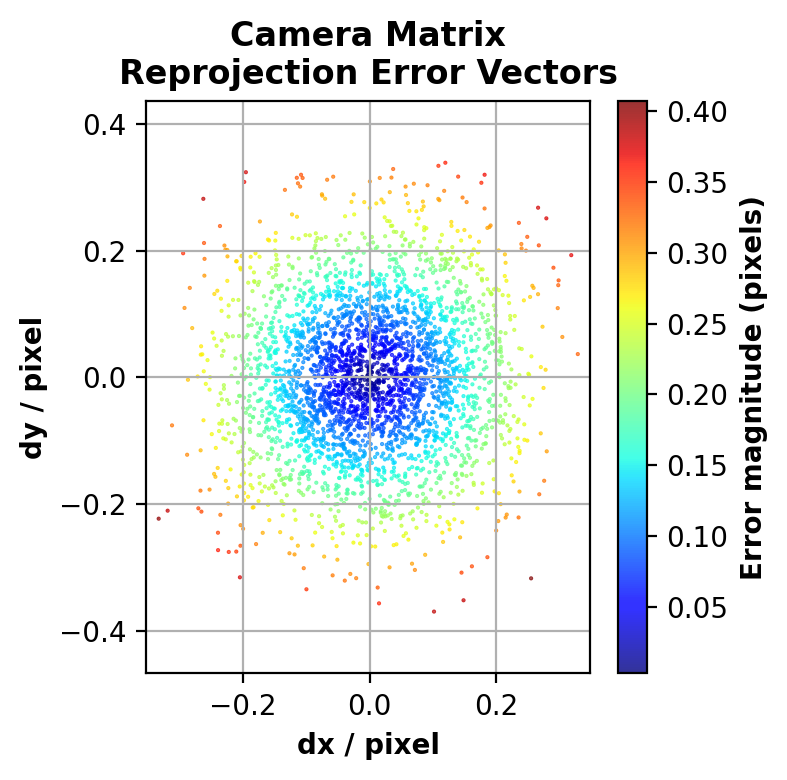

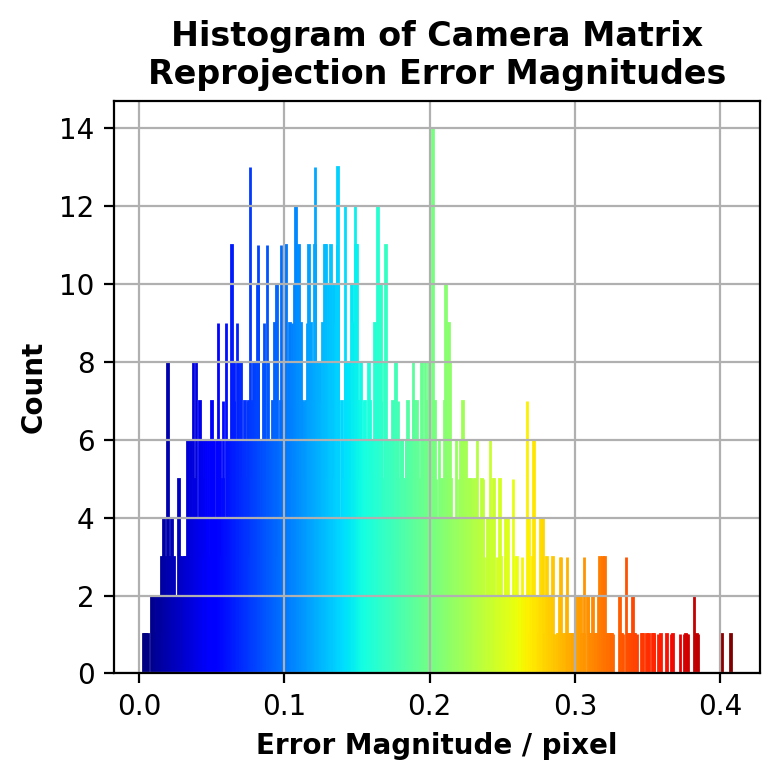

In [ ]:
# 2D reprojection error vectors (colored scatter)
plt.figure(figsize=(4, 4))
plt.title("Camera Matrix\nReprojection Error Vectors")
plt.xlabel("dx / pixel")
plt.ylabel("dy / pixel")

all_error_vectors = []  # list of (dx, dy)

for i in range(len(objpoints)):
    try:
        imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
        imgpoints2 = imgpoints2.reshape(-1, 2)
        imgpoints_gt = imgpoints[i].reshape(-1, 2)

        error_vec = imgpoints2 - imgpoints_gt  # (N,2)
        all_error_vectors.append(error_vec)

    except Exception as e:
        print(f"  Warning: Cannot compute errors for image {i}: {e}")

# stack all error vectors
all_error_vectors = np.vstack(all_error_vectors)
error_magnitudes = np.linalg.norm(all_error_vectors, axis=1)

# Scatter Plot (with colormap)
plt.scatter(
    all_error_vectors[:, 0],
    all_error_vectors[:, 1],
    c=error_magnitudes,
    cmap="jet",
    s=1,
    marker=".",
    alpha=0.8,
)

plt.axis("equal")
plt.grid(True)
cbar = plt.colorbar(label="Error magnitude (pixels)")
plt.tight_layout()
plt.show()


# Histogram of error magnitudes (colored bins)
plt.figure(figsize=(4, 4))
plt.title("Histogram of Camera Matrix\nReprojection Error Magnitudes")
plt.xlabel("Error Magnitude / pixel")
plt.ylabel("Count")
plt.grid(True)

# Create histogram in manual mode
N, bins, patches = plt.hist(error_magnitudes, bins=1000)

# compute bin centers for color mapping
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# normalize color range using min/max of the bin centers
norm = plt.Normalize(bin_centers.min(), bin_centers.max())

# apply colormap for each bin
for center, patch in zip(bin_centers, patches):
    color = plt.cm.jet(norm(center))
    patch.set_facecolor(color)
    patch.set_edgecolor(color)

plt.tight_layout()
plt.show()

# Undistortion Example

In [14]:
# print("--- Undistortion Example ---")
# if valid_image_filenames:
#     print("Showing undistortion example on the first image where corners were found...")
#     fname_example = valid_image_filenames[0]
#     print(f"Using image: {fname_example}")
#     try:
#         img_example = cv2.imread(fname_example, cv2.IMREAD_UNCHANGED)

#         if img_example is not None:
#             h, w = img_example.shape[:2]

#             # Method 1: Simple undistortion using the original matrix
#             dst_simple = cv2.undistort(img_example, mtx, dist, None, mtx)

#             # Method 2: Undistortion with refined camera matrix for better cropping
#             # Alpha=1: Retains all pixels, potentially with black borders
#             # Alpha=0: Removes all invalid pixels, potentially cropping significantly
#             alpha = 0.8  # Adjust between 0 and 1 for desired cropping
#             newcameramtx, roi = cv2.getOptimalNewCameraMatrix(
#                 mtx, dist, (w, h), alpha, (w, h)
#             )
#             dst_refined = cv2.undistort(img_example, mtx, dist, None, newcameramtx)

#             # Crop the refined image (optional, shows the valid area)
#             # x, y, w_roi, h_roi = roi
#             # dst_cropped = dst_refined[y:y+h_roi, x:x+w_roi]

#             # Display side-by-side using matplotlib
#             fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Increased figure size
#             fig.suptitle(f"Undistortion Example ({fname_example})", fontsize=16)

#             axes[0].imshow(cv2.cvtColor(img_example, cv2.COLOR_BGR2RGB))
#             axes[0].set_title("Original Image")
#             axes[0].axis("off")

#             axes[1].imshow(cv2.cvtColor(dst_simple, cv2.COLOR_BGR2RGB))
#             axes[1].set_title("cv2.undistort")
#             axes[1].axis("off")

#             axes[2].imshow(cv2.cvtColor(dst_refined, cv2.COLOR_BGR2RGB))
#             axes[2].set_title(f"Undistorted (Refined, alpha={alpha})")
#             axes[2].axis("off")

#             plt.tight_layout(pad=0.1)  # Adjust layout
#             plt.show()
#         else:
#             print(f"Could not load the example image {fname_example} for undistortion.")
#     except Exception as e:
#         print(f"An error occurred during undistortion display: {e}")
# else:
#     print("No valid images found to show undistortion example.")
# print("---------------------\n")

# Save Camera Calibration Results


In [15]:
print("--- Save Results ---")
output_filename = folder_name + "_camera_calibration_results.npz"
npz_save_dir = os.path.join(root_dir, output_filename)
print(f"Saving calibration results to '{npz_save_dir}'...")
try:
    np.savez(
        npz_save_dir,
        mtx=mtx,
        dist=dist,
        rvecs=np.array(rvecs, dtype=object),  # Save rvecs/tvecs if needed later
        tvecs=np.array(tvecs, dtype=object),
        img_size=np.array(image_size),
        reprojection_error=mean_error,
        chessboard_width=checkerboard_size[0],
        chessboard_height=checkerboard_size[1],
        square_size=SQUARE_SIZE,
    )
    print(f"✅ Calibration results saved.")
except Exception as e:
    print(f"❌ Error saving results: {e}")

print("---------------------")

output_filename = folder_name + "_camera_calibration_results.json"
json_save_dir = os.path.join(root_dir, output_filename)
print(f"Saving calibration results to '{json_save_dir}'...")
try:
    calibration_data = {
        "camera_matrix": mtx.tolist(),
        "dist_coeffs": dist.tolist(),
        "image_size": list(image_size),
        "reprojection_error": float(mean_error),
        "chessboard_width": checkerboard_size[0],
        "chessboard_height": checkerboard_size[1],
        "square_size": SQUARE_SIZE,
        "rvecs": [rvec.tolist() for rvec in rvecs],
        "tvecs": [tvec.tolist() for tvec in tvecs],
    }

    with open(json_save_dir, "w") as f:
        json.dump(calibration_data, f, indent=1, separators=(",", ": "))

    print(f"✅ Calibration results saved.")
except Exception as e:
    print(f"❌ Error saving results: {e}")

print("\n--- Calibration process finished. ---")

--- Save Results ---
Saving calibration results to './calibration_capture/12192025\12192025_camera_calibration_results.npz'...
✅ Calibration results saved.
---------------------
Saving calibration results to './calibration_capture/12192025\12192025_camera_calibration_results.json'...
✅ Calibration results saved.

--- Calibration process finished. ---


# Perform Projector Calibration

## projector parameters

In [16]:
# TARGETDIR = "./GrayCodePatterns"
CAPTUREDDIR = root_dir  # process the synthetic bit 0 gray code
projector_dir = os.path.join(CAPTUREDDIR, "projector_calibration_images")
os.makedirs(projector_dir, exist_ok=True)

bit0_synthetic_flag = True  # process the synthetic bit 0 gray code
gc_step = 1  # Logic-pixel pitch (default 1 → mim width of gray code=2 px).
if gc_step > 1:
    bit0_synthetic_flag = False  # process the synthetic bit 0 gray code
proj_height = 768  # Height of the projector image (default 720 px).
proj_width = 768  # Width of the projector image (default 1280 px).
proj_shape = (proj_height, proj_width)  # Shape of the projector image.
chess_vert = checkerboard_size[
    1
]  # Number of Checkerboard squares in vertical direction.
chess_hori = checkerboard_size[
    0
]  # Number of Checkerboard squares in horizontal direction.

if chess_hori < chess_vert:
    chess_hori, chess_vert = (
        chess_vert,
        chess_hori,
    )  # Ensure horizontal is greater than vertical.
chess_shape = (chess_hori, chess_vert)  # Shape of the Checkerboard pattern.
chess_block_size = SQUARE_SIZE
black_thr = 75  # threashold to determine whether a camera pixel captures projected area or not (default : 40)
white_thr = 10  # threashold to specify the robustness of gray code decoding. To avoid decoding errors, increase these variables (default: 5).

camera_param_file = json_save_dir  # Camera parameter file (default: None).
print(f"Using camera parameter file: {camera_param_file}")

Using camera parameter file: ./calibration_capture/12192025\12192025_camera_calibration_results.json


In [17]:
gc_height = int((proj_shape[0] - 1) / gc_step) + 1
gc_width = int((proj_shape[1] - 1) / gc_step) + 1
graycode = cv2.structured_light_GrayCodePattern.create(gc_width, gc_height)
num_one_direction_patterns = int(graycode.getNumberOfPatternImages() / 2)
num_one_direction_patterns

20

In [18]:
# Define the pattern pairs for bit 0
pairs = [
    ("HorBit0_Shifted_0", "HorBit0_Shifted_1"),
    ("HorBit0_Shifted_0_Inverse", "HorBit0_Shifted_1_Inverse"),
    ("VerBit0_Shifted_0", "VerBit0_Shifted_1"),
    ("VerBit0_Shifted_0_Inverse", "VerBit0_Shifted_1_Inverse"),
]

## load capture files (and process the synthetic bit 0 gray code)

In [ ]:
print("--- Loading captured image directories ---")

# find numeric folders
all_dirs = [d for d in glob.glob(CAPTUREDDIR + "/*") if os.path.isdir(d)]
digit_dirs = [
    d
    for d in all_dirs
    if os.path.isdir(d) and os.path.basename(os.path.normpath(d)).isdigit()
]

# sort by numeric name
sorted_dirs = sorted(digit_dirs, key=lambda d: int(os.path.basename(d)))

if not sorted_dirs:
    print(f"No numeric directories found in '{CAPTUREDDIR}'")
    sys.exit(1)

if bit0_synthetic_flag:
    for dir_path in tqdm(sorted_dirs, desc="Processing folders"):
        print(f"\nProcessing directory: {dir_path}")
        utils.process_bit0_numeric_files(dir_path, pairs)

# pick first 10 and last for display
if len(sorted_dirs) > 11:
    display_dirs = sorted_dirs[:10] + [sorted_dirs[-1]]
else:
    display_dirs = sorted_dirs

print(f"Found {len(sorted_dirs)} directories in '{CAPTUREDDIR}':")

# collect across all sorted_dirs
# used_dirnames = []
# gc_fname_lists = []

# for d in sorted_dirs:
#     pngs = sorted(
#         glob.glob(os.path.join(d, "*.png")),
#         key=lambda f: int(
#             os.path.basename(f).split("_")[0]
#             #     os.path.basename(f)
#             #     .split("_")[1]
#             #     .split(".")[0]
#         ),
#     )
#     if pngs:
#         used_dirnames.append(d)
#         gc_fname_lists.append(pngs)

used_dirnames = []
gc_fname_lists = []

for d in sorted_dirs:

    # find all NN_00.png files (filter out HorBit, VerBit, SynthBit, Inverse...)
    pngs_all = glob.glob(os.path.join(d, "*.png"))
    pngs_num = sorted(
        [p for p in pngs_all if utils.is_graycode_main_file(p)],
        key=lambda f: int(os.path.basename(f).split("_")[0]),
    )

    if len(pngs_num) < 2:
        print(f"Directory {d} does not contain at least 2 valid base images.")
        continue

    # 00_00.png, 01_00.png is white/black images
    mandatory = pngs_num[:2]
    # graycode patterns start from 02_00.png
    gray_rest = pngs_num[2:]

    # compute the number of patterns per direction
    total_rest = len(gray_rest)
    half_total_rest = int(total_rest / 2)
    group_size = num_one_direction_patterns

    if total_rest < 2 * group_size:
        print(f"Warning: directory {d} does not have enough GrayCode files.")
        continue

    # horizontal patterns
    group_A = gray_rest[:group_size]

    # vertical patterns
    group_B = gray_rest[half_total_rest : half_total_rest + group_size]

    # combine selected files
    selected_pngs = mandatory + group_A + group_B

    used_dirnames.append(d)
    gc_fname_lists.append(selected_pngs)


# now print tree for display_dirs only
for idx, d in enumerate(display_dirs):
    # after the 10th entry, show ellipsis if there are more
    if idx == 10 and len(sorted_dirs) > 11:
        print("│   ......\n")

    dir_name = os.path.basename(d)
    branch = "└───" if idx == len(display_dirs) - 1 else "├───"
    print(f"{branch}{dir_name}")

    # grab the full list we collected earlier
    pngs = gc_fname_lists[used_dirnames.index(d)]

    # pick first 10 + last for display
    if len(pngs) > 11:
        display_files = pngs[:10] + [pngs[-1]]
    else:
        display_files = pngs

    for j, fpath in enumerate(display_files):
        # after the 10th file, show ellipsis if there are more
        if j == 10 and len(pngs) > 11:
            print("│   │   ...")

        fname = os.path.basename(fpath)
        fbranch = "└───" if j == len(display_files) - 1 else "├───"
        print(f"│   {fbranch}{fname}")

    # print a separator line except after the last displayed directory
    if idx < len(display_dirs) - 2:
        print("│")

--- Loading captured image directories ---


Processing folders:   0%|          | 0/29 [00:00<?, ?it/s]


Processing directory: ./calibration_capture/12192025\1
Files selected for replacement:
   20_00.png
   21_00.png
   40_00.png
   41_00.png
Moving ./calibration_capture/12192025\1\20_00.png -> ./calibration_capture/12192025\1\org_bit0\20_00.png
Moving ./calibration_capture/12192025\1\21_00.png -> ./calibration_capture/12192025\1\org_bit0\21_00.png
Moving ./calibration_capture/12192025\1\40_00.png -> ./calibration_capture/12192025\1\org_bit0\40_00.png
Moving ./calibration_capture/12192025\1\41_00.png -> ./calibration_capture/12192025\1\org_bit0\41_00.png
Writing new diff image: ./calibration_capture/12192025\1\20_00.png
Writing new diff image: ./calibration_capture/12192025\1\21_00.png
Writing new diff image: ./calibration_capture/12192025\1\40_00.png
Writing new diff image: ./calibration_capture/12192025\1\41_00.png

✓ Processing complete.

Processing directory: ./calibration_capture/12192025\2
Files selected for replacement:
   20_00.png
   21_00.png
   40_00.png
   41_00.png
Moving .

## load calibrated camera matrix

In [20]:
camP = None
cam_dist = None

try:
    path, ext = os.path.splitext(camera_param_file)
    if ext == ".json":
        camP, camD = utils.loadCameraParam(camera_param_file)
        print("load camera parameters")
        print(camP)
        print(camD)
except Exception as e:
    print(f"Failed loading camera parameters: {e}")

# camP = None
# cam_dist = None

load camera parameters
[[4.52103546e+03 0.00000000e+00 5.31341398e+02]
 [0.00000000e+00 4.52684027e+03 4.33170042e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[0. 0. 0. 0. 0.]]


## start calibration

In [21]:
objps = np.zeros(
    (chess_shape[0] * chess_shape[1], 3), np.float32
)  # Checkerboard corners 3D points
objps[:, :2] = chess_block_size * np.mgrid[
    0 : chess_shape[0], 0 : chess_shape[1]
].T.reshape(
    -1, 2
)  # resize to (N,2)

print("Start Calibrating ...")
gc_height = int((proj_shape[0] - 1) / gc_step) + 1
gc_width = int((proj_shape[1] - 1) / gc_step) + 1
graycode = cv2.structured_light.GrayCodePattern.create(gc_width, gc_height)
graycode.setBlackThreshold(black_thr)
graycode.setWhiteThreshold(white_thr)

cam_shape = cv2.imread(gc_fname_lists[0][0], cv2.IMREAD_GRAYSCALE).shape
patch_size_half = int(np.ceil(cam_shape[1] / 180) / 1)
print("  patch size :", patch_size_half * 2 + 1)

Start Calibrating ...
  patch size : 13


In [22]:
cam_shape

(928, 928)

In [23]:
gc_width, gc_height, patch_size_half

(768, 768, 6)

In [24]:
cam_corners_list = []  # list of camera corners for all views
cam_objps_list = []  # list of object points for all views
cam_corners_list2 = []  # list of refined camera corners for all views
proj_objps_list = []  # list of projector object points for all views
proj_corners_list = []  # list of projector corners for all views
flags = (
    cv2.CALIB_CB_EXHAUSTIVE | cv2.CALIB_CB_ACCURACY | cv2.CALIB_CB_MARKER
)  # flags for findChessboardCornersSB
criteria = (
    cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
    100,
    1e-6,
)  # criteria for cornerSubPix

cnt = 1  # counter for projector image
for dname, gc_filenames in tqdm(
    zip(used_dirnames, gc_fname_lists), total=len(used_dirnames)
):
    print("  checking '" + dname + "'")
    if len(gc_filenames) != graycode.getNumberOfPatternImages() + 2:
        print("Error : invalid number of images in '" + dname + "'")
        sys.exit(1)

    imgs = []  # captured images
    for fname in gc_filenames:
        img = cv2.imread(fname, cv2.IMREAD_GRAYSCALE)
        if cam_shape != img.shape:
            print("Error : image size of '" + fname + "' is mismatch")
            sys.exit(1)

        imgs.append(img)

    white_img = imgs.pop(0)  # first image : white
    black_img = imgs.pop(0)  # second image : black

    # res, cam_corners = cv2.findChessboardCornersSB(white_img, chess_shape)
    res, cam_corners = cv2.findChessboardCornersSB(
        white_img,
        chess_shape,
        flags=flags,
    )  # find camera corners
    cam_corners2 = cv2.cornerSubPix(
        white_img, cam_corners, (7, 7), (-1, -1), criteria
    )  # refine camera corners
    if not res:
        print("Error : Checkerboard was not found in '" + gc_filenames[-2] + "'")
        sys.exit(1)

    cam_objps_list.append(objps)  # list of object points for all views
    cam_corners_list.append(cam_corners2)  # list of camera corners for all views

    proj_objps = []
    proj_corners = []
    cam_corners2 = []
    viz_proj_points = np.zeros(proj_shape, np.uint8)
    for corner, objp in zip(cam_corners, objps):
        c_x = int(round(corner[0][0]))
        c_y = int(round(corner[0][1]))
        src_points = []
        dst_points = []
        for dx in range(-patch_size_half, patch_size_half + 1):
            for dy in range(-patch_size_half, patch_size_half + 1):
                x = c_x + dx
                y = c_y + dy
                if int(white_img[y, x]) - int(black_img[y, x]) <= black_thr:
                    continue
                err, proj_pix = graycode.getProjPixel(imgs, x, y)
                if not err:
                    src_points.append((x, y))
                    dst_points.append(gc_step * np.array(proj_pix))
        if len(src_points) < patch_size_half**2:
            print(
                "    Warning : corner",
                c_x,
                c_y,
                "was skiped because decoded pixels were too few (check your images and threasholds)",
            )
            continue
        h_mat, inliers = cv2.findHomography(np.array(src_points), np.array(dst_points))
        point = h_mat @ np.array([corner[0][0], corner[0][1], 1]).transpose()
        point_pix = point[0:2] / point[-1]  # normalize
        proj_objps.append(objp)
        proj_corners.append([point_pix])
        cam_corners2.append(corner)
        viz_proj_points[int(round(point_pix[1])), int(round(point_pix[0]))] = 255
    if len(proj_corners) < 3:
        print("Error : too few corners were found in '" + dname + "' (less than 3)")
        sys.exit(1)

    proj_objps_list.append(np.float32(proj_objps))
    proj_corners_list.append(np.float32(proj_corners))
    cam_corners_list2.append(np.float32(cam_corners2))
    cv2.imwrite(
        projector_dir + "/visualize_corners_projector_" + str(cnt) + ".png",
        viz_proj_points,
    )
    cnt += 1

  0%|          | 0/29 [00:00<?, ?it/s]

  checking './calibration_capture/12192025\1'
  checking './calibration_capture/12192025\2'
  checking './calibration_capture/12192025\3'
  checking './calibration_capture/12192025\4'
  checking './calibration_capture/12192025\5'
  checking './calibration_capture/12192025\6'
  checking './calibration_capture/12192025\7'
  checking './calibration_capture/12192025\8'
  checking './calibration_capture/12192025\9'
  checking './calibration_capture/12192025\10'
  checking './calibration_capture/12192025\11'
  checking './calibration_capture/12192025\12'
  checking './calibration_capture/12192025\13'
  checking './calibration_capture/12192025\14'
  checking './calibration_capture/12192025\15'
  checking './calibration_capture/12192025\16'
  checking './calibration_capture/12192025\17'
  checking './calibration_capture/12192025\18'
  checking './calibration_capture/12192025\19'
  checking './calibration_capture/12192025\20'
  checking './calibration_capture/12192025\21'
  checking './calibrat

In [25]:
cam_shape, proj_shape

((928, 928), (768, 768))

In [26]:
camP

array([[4.52103546e+03, 0.00000000e+00, 5.31341398e+02],
       [0.00000000e+00, 4.52684027e+03, 4.33170042e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [27]:
print("Initial solution of camera's intrinsic parameters")
cam_rvecs = []
cam_tvecs = []
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-6)
flags = (
    cv2.CALIB_ZERO_TANGENT_DIST | cv2.CALIB_FIX_K3 | cv2.CALIB_FIX_K2 | cv2.CALIB_FIX_K1
)

if camP is None:
    ret, cam_int, cam_dist, cam_rvecs, cam_tvecs = cv2.calibrateCamera(
        cam_objps_list,
        cam_corners_list,
        cam_shape[::-1],  # (width, height)
        cameraMatrix=None,
        distCoeffs=None,
        flags=flags,
        criteria=None,
    )
    print("  RMS:", ret)
else:
    for objp, corners in zip(cam_objps_list, cam_corners_list):
        ret, cam_rvec, cam_tvec = cv2.solvePnP(objp, corners, camP, camD)
        if ret:
            cam_rvecs.append(cam_rvec)
            cam_tvecs.append(cam_tvec)
        else:
            print(
                "  solvePnP failed for one view during initial camera parameter setup, when using",
                objp,
                corners,
            )
    # cam_rvecs, cam_tvecs = rvecs, tvecs
    cam_int = camP
    cam_dist = camD
print("  Intrinsic parameters :")
utils.printNumpyWithIndent(cam_int, "    ")
print("  Distortion parameters :")
utils.printNumpyWithIndent(cam_dist, "    ")
print()

print("Initial solution of projector's parameters")
ret, proj_int, proj_dist, proj_rvecs, proj_tvecs = cv2.calibrateCamera(
    proj_objps_list,
    proj_corners_list,
    proj_shape[::-1],  # (width, height)
    cameraMatrix=None,
    distCoeffs=None,
    flags=flags,
    criteria=None,
)
print("  RMS :", ret)
print("  Intrinsic parameters :")
utils.printNumpyWithIndent(proj_int, "    ")
print("  Distortion parameters :")
utils.printNumpyWithIndent(proj_dist, "    ")
print()

Initial solution of camera's intrinsic parameters
  Intrinsic parameters :
    [[4.52103546e+03 0.00000000e+00 5.31341398e+02]
     [0.00000000e+00 4.52684027e+03 4.33170042e+02]
     [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
  Distortion parameters :
    [[0. 0. 0. 0. 0.]]

Initial solution of projector's parameters
  RMS : 0.1974359521851299
  Intrinsic parameters :
    [[2.33559868e+03 0.00000000e+00 3.86381217e+02]
     [0.00000000e+00 2.43116406e+03 6.44915337e+02]
     [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
  Distortion parameters :
    [[0. 0. 0. 0. 0.]]



# Perform Joint Calibration

In [28]:
print("=== Result ===")
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-6)
ret, cam_int, cam_dist, proj_int, proj_dist, cam_proj_rmat, cam_proj_tvec, E, F = (
    cv2.stereoCalibrate(
        proj_objps_list,
        cam_corners_list2,
        proj_corners_list,
        cam_int,
        cam_dist,
        proj_int,
        proj_dist,
        None,
        # criteria=None,
        flags=cv2.CALIB_FIX_INTRINSIC,
    )
)

print("  RMS :", ret)
print("  Camera intrinsic parameters :")
utils.printNumpyWithIndent(cam_int, "    ")
print("  Camera distortion parameters :")
utils.printNumpyWithIndent(cam_dist, "    ")
print("  Projector intrinsic parameters :")
utils.printNumpyWithIndent(proj_int, "    ")
print("  Projector distortion parameters :")
utils.printNumpyWithIndent(proj_dist, "    ")
print("  Rotation matrix / translation vector from camera to projector")
print("  (they translate points from camera coord to projector coord) :")
utils.printNumpyWithIndent(cam_proj_rmat, "    ")
utils.printNumpyWithIndent(cam_proj_tvec, "    ")
print()
fs = cv2.FileStorage("calibration_result.xml", cv2.FILE_STORAGE_WRITE)
fs.write("img_shape", cam_shape)
fs.write("rms", ret)
fs.write("cam_int", cam_int)
fs.write("cam_dist", cam_dist)
fs.write("proj_int", proj_int)
fs.write("proj_dist", proj_dist)
fs.write("rotation", cam_proj_rmat)
fs.write("translation", cam_proj_tvec)
fs.release()

=== Result ===
  RMS : 0.2176568454506575
  Camera intrinsic parameters :
    [[4.52103546e+03 0.00000000e+00 5.31341398e+02]
     [0.00000000e+00 4.52684027e+03 4.33170042e+02]
     [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
  Camera distortion parameters :
    [[0. 0. 0. 0. 0.]]
  Projector intrinsic parameters :
    [[2.33559868e+03 0.00000000e+00 3.86381217e+02]
     [0.00000000e+00 2.43116406e+03 6.44915337e+02]
     [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
  Projector distortion parameters :
    [[0. 0. 0. 0. 0.]]
  Rotation matrix / translation vector from camera to projector
  (they translate points from camera coord to projector coord) :
    [[ 0.95982411 -0.02644577  0.27935335]
     [ 0.02992056  0.9995188  -0.00818113]
     [-0.27900257  0.01621086  0.96015352]]
    [[-437.34655832]
     [-155.09560539]
     [-164.24361931]]



# Set Global World Coordinate 

We build the checkerboard 3D corner coordinates on a plane with units in mm. With `nx × ny` inner corners and square size ($s$), the object (checkerboard) points satisfy
$$
\mathbf{X}_{obj}=\begin{bmatrix} i\times s \\ j\times s \\ 0 \end{bmatrix},\qquad i=0,\dots,n_x-1,\; j=0,\dots,n_y-1.
$$
OpenCV `calibrateCamera` returns extrinsics ($\mathbf{R},\mathbf{t}$) (from `rvec_select, tvec_select`) that map checkerboard/object coordinates to camera coordinates:
$$
\mathbf{X}_{cam}=\mathbf{R},\mathbf{X}_{obj}+\mathbf{t}.
$$
You compute the checkerboard centroid in object coordinates
$$
\mathbf{c}=\frac{1}{N}\sum_{k=1}^{N}\mathbf{X}^{(k)}_{obj},
$$
and define a **new world frame** whose axes are the same as the checkerboard frame but whose origin is at the centroid. This corresponds to the change of variables
$$
\mathbf{X}_{obj}=\mathbf{X}_{w}+\mathbf{c}\quad\Longleftrightarrow\quad \mathbf{X}_{w}=\mathbf{X}_{obj}-\mathbf{c}.
$$
Substituting into the original extrinsic equation yields
$$
\mathbf{X}_{cam}=\mathbf{R}(\mathbf{X}_{w}+\mathbf{c})+\mathbf{t}
=\mathbf{R}\mathbf{X}_{w}+\underbrace{(\mathbf{t}+\mathbf{R}\mathbf{c})}_{\mathbf{t}_{new}},
$$
so in the new world frame the rotation is unchanged and the translation becomes
$$
\mathbf{R}_{w\to cam}=\mathbf{R},\qquad \mathbf{t}_{new}=\mathbf{t}+\mathbf{R}\mathbf{c}.
$$
From the world-to-camera transform
$$
\mathbf{X}_{cam}=\mathbf{R}_{w\to cam}\mathbf{X}_{w}+\mathbf{t}_{new},
$$
the camera center in world coordinates is obtained by setting $\mathbf{X}_{cam}=\mathbf{0}$:
$$
\mathbf{C}_{cam}^{(w)}=-\mathbf{R}_{w\to cam}^{-1}\mathbf{t}_{new}=-\mathbf{R}_{w\to cam}^{T}\mathbf{t}_{new}.
$$
The camera optical axis in camera coordinates is taken as $\hat{\mathbf{z}}_{cam}=[0,0,1]^T$; converting a direction vector to world coordinates uses the camera-to-world rotation:
$$
\hat{\mathbf{z}}_{cam}^{(w)}=\mathbf{R}_{cam\to w}\hat{\mathbf{z}}_{cam}
=\mathbf{R}_{w\to cam}^{T}\hat{\mathbf{z}}_{cam}.
$$
Next, from stereo calibration you assume the projector pose relative to the camera is
$$
\mathbf{X}_{proj}=\mathbf{R}_{p\leftarrow c}\mathbf{X}_{cam}+\mathbf{t}_{p\leftarrow c}.
$$
Composing this with the world-to-camera transform gives the world-to-projector transform
$$
\mathbf{X}_{proj}
=\mathbf{R}_{p\leftarrow c}(\mathbf{R}_{w\to cam}\mathbf{X}_{w}+\mathbf{t}_{new})+\mathbf{t}_{p\leftarrow c}
=\underbrace{(\mathbf{R}_{p\leftarrow c}\mathbf{R}_{w\to cam})}_{\mathbf{R}_{w\to proj}},\mathbf{X}_{w}
+\underbrace{(\mathbf{R}_{p\leftarrow c}\mathbf{t}_{new}+\mathbf{t}_{p\leftarrow c})}_{\mathbf{t}_{w\to proj}}.
$$
Thus,
$$
\mathbf{R}_{w\to proj}=\mathbf{R}_{p\leftarrow c}\mathbf{R}_{w\to cam},\qquad
\mathbf{t}_{w\to proj}=\mathbf{R}_{p\leftarrow c}\mathbf{t}_{new}+\mathbf{t}_{p\leftarrow c}.
$$
Finally, the projector center and optical axis in the new world frame follow the same pattern:
$$
\mathbf{C}_{proj}^{(w)}=-\mathbf{R}_{w\to proj}^{T}\mathbf{t}_{w\to proj},\qquad
\hat{\mathbf{z}}_{proj}^{(w)}=\mathbf{R}_{w\to proj}^{T}[0,0,1]^T.
$$
Final printed matrices correspond to $\mathbf{R}_{w\to cam}$, $\mathbf{R}_{cam\to w}=\mathbf{R}_{w\to cam}^T$, $\mathbf{R}_{w\to proj}$, and $\mathbf{R}_{proj\to w}=\mathbf{R}_{w\to proj}^T$.


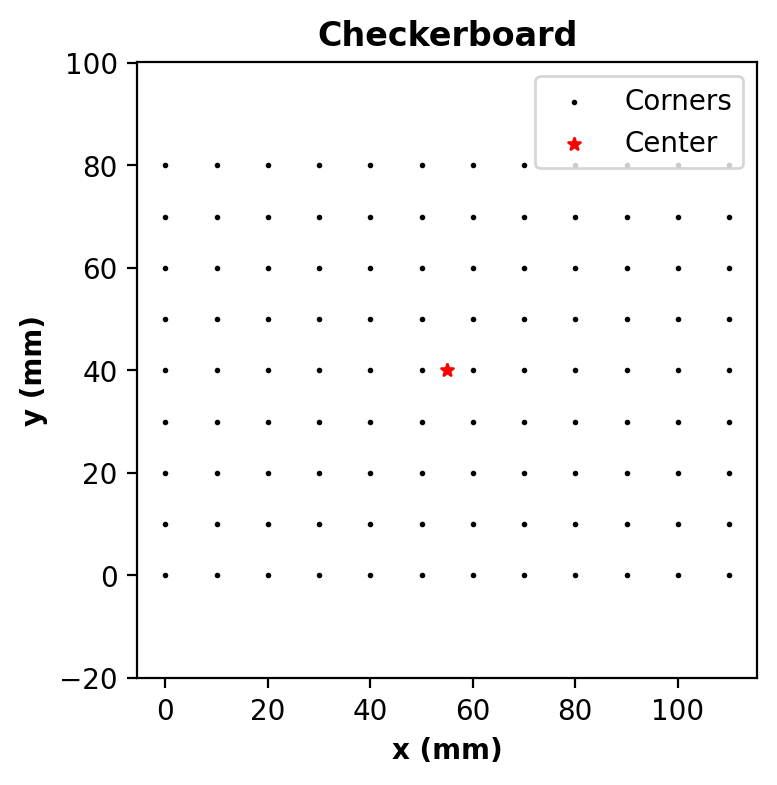

In [ ]:
# Construct the real-world coordinates of the checkerboard corners
#    Ensure it matches the coordinates used during calibrateCamera.
#    Assume the checkerboard has nx × ny inner corners, and each square is square_size mm.
nx, ny = checkerboard_size
square_size = SQUARE_SIZE  # in millimeters
objp = np.zeros((nx * ny, 3), dtype=np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) * square_size


# Load parameters from calibrateCamera / stereoCalibrate
#    cam_rvecs and cam_tvecs are lists returned by calibrateCamera
#    cam_proj_rmat and cam_proj_tvec are the rotation matrix and translation vector from stereoCalibrate
rvec_select = cam_rvecs[0]  # Rotation vector for the first checkerboard image
tvec_select = cam_tvecs[0]  # Translation vector for the first checkerboard image
R_select, _ = cv2.Rodrigues(rvec_select)  # Convert to 3x3 rotation matrix
centroid = objp.mean(axis=0).reshape(
    3, 1
)  # Compute checkerboard center in object coordinates

plt.scatter(objp[:, 0], objp[:, 1], label="Corners", s=1, color="k")
plt.scatter(centroid[0], centroid[1], color="r", label="Center", s=20, marker="*")
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.title("Checkerboard")
plt.axis("equal")
plt.legend()
plt.show()

In [ ]:
# Define a new world coordinate system:
#    The checkerboard plane becomes the XOY plane, and its center becomes the world origin.
rvec_new = rvec_select
t_new = tvec_select + R_select @ centroid

# Compute the camera position and optical axis in the new world coordinate system
#    World to camera: X_cam = R_select @ X_world + t_new
#    Camera center in world coordinates: X_world_cam_center = -R_select.T @ t_new
R_cam2world = (
    R_select.T
)  #  R_select is world to camera, so its transpose is camera to world
cam_position = (-R_cam2world @ t_new).ravel()
# The camera's optical axis is +Z in its own coordinate frame; transform it into world coordinates:
cam_optical_axis = (R_cam2world @ np.array([0.0, 0.0, 1.0])).ravel()

# Compute the projector position and optical axis in the new world coordinate system
#    Given: X_proj = cam_proj_rmat @ X_cam + cam_proj_tvec
#    And:   X_cam = R_select @ X_world + t_new
#    Then:  X_proj = (cam_proj_rmat @ R_select) @ X_world + (cam_proj_rmat @ t_new + cam_proj_tvec)
R_wp = cam_proj_rmat.dot(R_select)
t_wp = cam_proj_rmat.dot(t_new) + cam_proj_tvec
R_proj2world = (
    R_wp.T
)  # R_wp is world to projector, so its transpose is projector to world
proj_position = (-R_proj2world @ t_wp).ravel()
proj_optical_axis = (R_proj2world @ np.array([0.0, 0.0, 1.0])).ravel()

# Print the results
print("=== New world coordinate system (checkerboard center as origin) ===")
print(f"rvec_new (camera rotation vector):   {rvec_new.ravel()}")
print(f"t_new (camera translation vector):   {t_new.ravel()}\n")

print(f"Camera position in world coordinates:     {cam_position}")
print(f"Camera optical axis direction (world):    {cam_optical_axis}\n")

print(f"Projector position in world coordinates:  {proj_position}")
print(f"Projector optical axis direction (world): {proj_optical_axis}")

# Output camera/projector rotation matrices relative to world origin
R_world_to_cam = R_select
R_cam_to_world = R_world_to_cam.T

R_world_to_proj = R_wp
R_proj_to_world = R_world_to_proj.T

print("Rotation matrix: world → camera")
print(R_world_to_cam)
print("\nRotation matrix: camera → world")
print(R_cam_to_world)

print("\nRotation matrix: world → projector")
print(R_world_to_proj)
print("\nRotation matrix: projector → world")
print(R_proj_to_world)

=== New world coordinate system (checkerboard center as origin) ===
rvec_new (camera rotation vector):   [-3.10086077e+00 -2.01751385e-03  1.10115053e-02]
t_new (camera translation vector):   [-3.28091104e+01  7.18259397e-01  1.65250894e+03]

Camera position in world coordinates:     [  44.49493252   68.0206219  1650.83498548]
Camera optical axis direction (world):    [-0.00707271 -0.04070479 -0.99914618]

Projector position in world coordinates:  [ 421.3176807   -88.87853495 1375.71701733]
Projector optical axis direction (world): [-0.28576276 -0.05560283 -0.95668593]
Rotation matrix: world → camera
[[ 0.99997394  0.00115617 -0.00712567]
 [ 0.00144524 -0.99917055  0.04069555]
 [-0.00707271 -0.04070479 -0.99914618]]

Rotation matrix: camera → world
[[ 0.99997394  0.00144524 -0.00707271]
 [ 0.00115617 -0.99917055 -0.04070479]
 [-0.00712567  0.04069555 -0.99914618]]

Rotation matrix: world → projector
[[ 0.9577851   0.01616254 -0.28703045]
 [ 0.03142218 -0.99832214  0.04863691]
 [-0.2857

## calculation validation

In [31]:
Xcam_center = R_select @ centroid + tvec_select
print(np.linalg.norm(Xcam_center - t_new))  # should be close to 0
Xcam_old_origin = R_select @ (-centroid) + t_new
print(np.linalg.norm(Xcam_old_origin - tvec_select))  # should be close to 0
Xw = np.array([[10.0], [20.0], [0.0]])  # arbitrary world point on checkerboard plane
Xproj_path1 = cam_proj_rmat @ (R_select @ Xw + t_new) + cam_proj_tvec
Xproj_path2 = R_wp @ Xw + t_wp
print(np.linalg.norm(Xproj_path1 - Xproj_path2))  # should be close to 0

0.0
0.0
7.105427357601002e-15


# System Reprojection Error 

--- Camera Reprojection Error (by GrayCode sets) ---
Set 00: error = 0.156 pixels
Set 01: error = 0.1572 pixels
Set 02: error = 0.1434 pixels
Set 03: error = 0.1569 pixels
Set 04: error = 0.1164 pixels
Set 05: error = 0.1452 pixels
Set 06: error = 0.1422 pixels
Set 07: error = 0.129 pixels
Set 08: error = 0.1469 pixels
Set 09: error = 0.1413 pixels
Set 10: error = 0.1575 pixels
Set 11: error = 0.1513 pixels
Set 12: error = 0.1449 pixels
Set 13: error = 0.1439 pixels
Set 14: error = 0.1365 pixels
Set 15: error = 0.1668 pixels
Set 16: error = 0.1528 pixels
Set 17: error = 0.1499 pixels
Set 18: error = 0.1625 pixels
Set 19: error = 0.1511 pixels
Set 20: error = 0.1473 pixels
Set 21: error = 0.1479 pixels
Set 22: error = 0.1151 pixels
Set 23: error = 0.117 pixels
Set 24: error = 0.1812 pixels
Set 25: error = 0.1168 pixels
Set 26: error = 0.1529 pixels
Set 27: error = 0.1141 pixels
Set 28: error = 0.1115 pixels

Mean Camera Reprojection Error: 0.1433 pixels


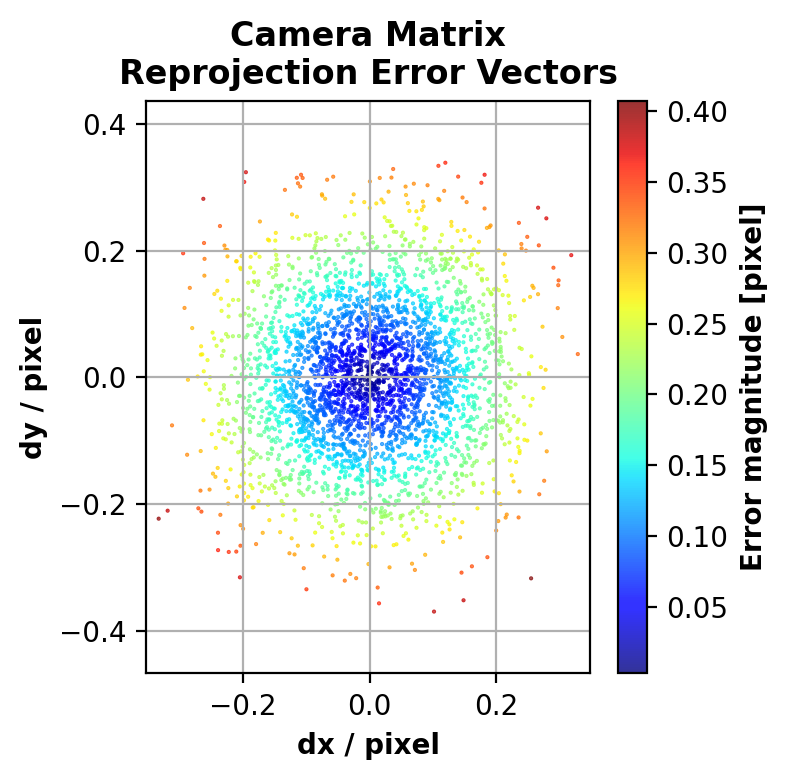

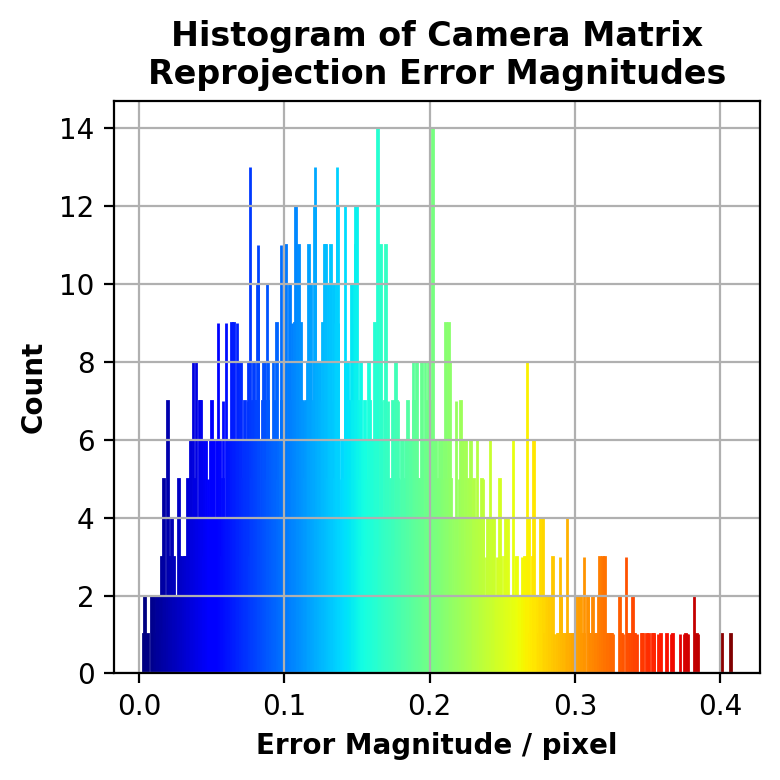

In [ ]:
# Camera reprojection error (per GrayCode set)
# use the same set of points corresponding to GrayCode data：cam_objps_list ↔ cam_corners_list ↔ (cam_rvecs, cam_tvecs)
print("--- Camera Reprojection Error (by GrayCode sets) ---")
cam_mean_error = 0.0
cam_all_errors = []
cam_all_vecs = []

for i, (objp_i, img_corners_i, rvec_i, tvec_i) in enumerate(
    zip(cam_objps_list, cam_corners_list, cam_rvecs, cam_tvecs)
):
    try:
        proj2_i, _ = cv2.projectPoints(objp_i, rvec_i, tvec_i, cam_int, cam_dist)
        proj2_i = proj2_i.reshape(-1, 2)
        gt_i = img_corners_i.reshape(-1, 2)

        err_vec_i = proj2_i - gt_i
        # err_i = cv2.norm(gt_i, proj2_i, cv2.NORM_L2) / len(proj2_i)
        err_i = np.mean(np.linalg.norm(err_vec_i, axis=1))

        print(f"Set {i:02d}: error = {err_i:.4g} pixels")
        cam_all_errors.append(err_i)
        cam_all_vecs.append(err_vec_i)
    except Exception as e:
        print(f"  Warning: Camera reprojection failed for set {i}: {e}")

if cam_all_errors:
    cam_mean_error = float(np.mean(cam_all_errors))
    print(f"\nMean Camera Reprojection Error: {cam_mean_error:.4f} pixels")
else:
    print("\nCould not calculate camera reprojection error.")

# visualize reprojection error vectors as scatter plot colored by magnitude
try:
    if cam_all_vecs:
        cam_all_vecs = np.vstack(cam_all_vecs)
        cam_mags = np.linalg.norm(cam_all_vecs, axis=1)

        plt.figure(figsize=(4, 4))
        plt.title("Camera Matrix\nReprojection Error Vectors")
        plt.xlabel("dx / pixel")
        plt.ylabel("dy / pixel")
        # Color each point by magnitude
        plt.scatter(
            cam_all_vecs[:, 0],
            cam_all_vecs[:, 1],
            c=cam_mags,
            cmap="jet",
            s=1,  # point size
            marker=".",
            alpha=0.8,
        )
        cbar = plt.colorbar(label="Error magnitude [pixel]")
        plt.axis("equal")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        cam_mags = np.linalg.norm(cam_all_vecs, axis=1)

        plt.figure(figsize=(4, 4))
        plt.title("Histogram of Camera Matrix\nReprojection Error Magnitudes")
        plt.xlabel("Error Magnitude / pixel")
        plt.ylabel("Count")
        plt.grid(True)

        N, bins, patches = plt.hist(cam_mags, bins=1000, edgecolor="black")

        # use bin centers for color mapping
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # normalize the range of x-axis
        norm = plt.Normalize(bin_centers.min(), bin_centers.max())

        for center, patch in zip(bin_centers, patches):
            color = plt.cm.jet(norm(center))  # match scatter colors
            patch.set_facecolor(color)
            patch.set_edgecolor(color)

        plt.tight_layout()
        plt.show()

except Exception as e:
    print(f"  Warning: Camera error visualization skipped: {e}")


--- Projector Reprojection Error (by GrayCode sets) ---
Set 00: error = 0.6588 pixels
Set 01: error = 0.6399 pixels
Set 02: error = 0.483 pixels
Set 03: error = 0.3643 pixels
Set 04: error = 0.8927 pixels
Set 05: error = 0.389 pixels
Set 06: error = 0.3986 pixels
Set 07: error = 0.4987 pixels
Set 08: error = 0.2042 pixels
Set 09: error = 0.3 pixels
Set 10: error = 0.2688 pixels
Set 11: error = 0.4148 pixels
Set 12: error = 0.6978 pixels
Set 13: error = 0.2867 pixels
Set 14: error = 0.9829 pixels
Set 15: error = 0.207 pixels
Set 16: error = 0.7794 pixels
Set 17: error = 0.2757 pixels
Set 18: error = 0.5177 pixels
Set 19: error = 1.682 pixels
Set 20: error = 0.3341 pixels
Set 21: error = 0.4145 pixels
Set 22: error = 0.2984 pixels
Set 23: error = 0.4522 pixels
Set 24: error = 0.7304 pixels
Set 25: error = 0.4094 pixels
Set 26: error = 0.3966 pixels
Set 27: error = 0.8962 pixels
Set 28: error = 0.4399 pixels

Mean Projector Reprojection Error: 0.5280 pixels
(Lower is better; Should be of

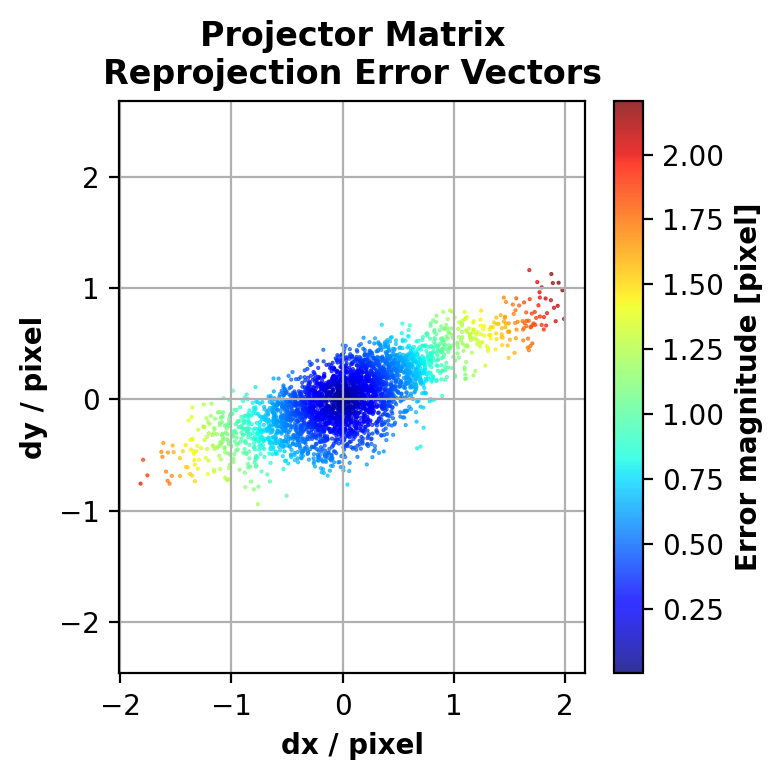

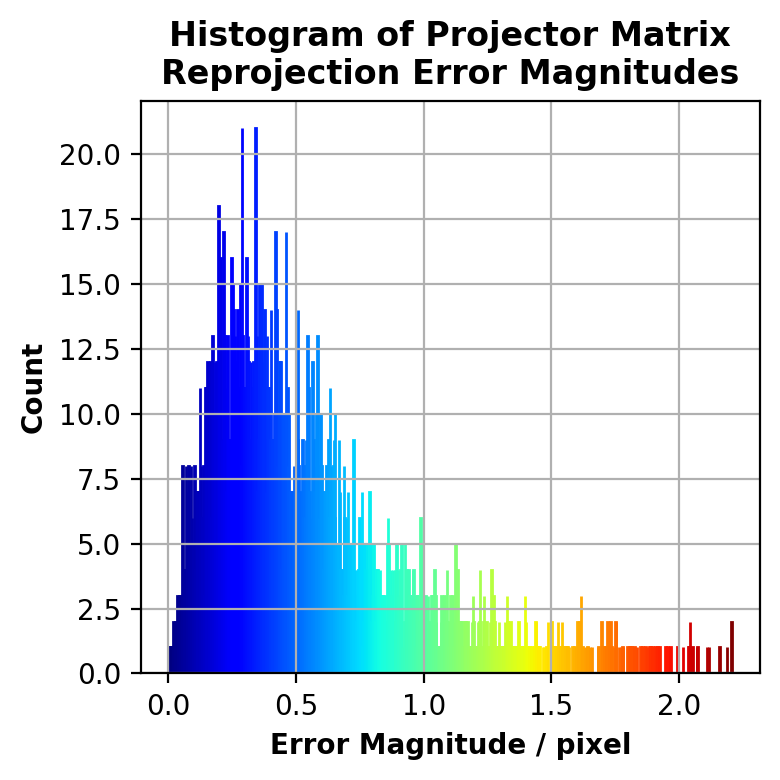

In [ ]:
# Projector reprojection error (per GrayCode set) 
# combine every set's world->projector extrinsics: R_pw = R_cp * R_cw, t_pw = R_cp * t_cw + t_cp
# then project proj_objps_list to projector image plane, compare with proj_corners_list for L2 error
print("\n--- Projector Reprojection Error (by GrayCode sets) ---")
proj_mean_error = 0.0
proj_all_errors = []
proj_all_vecs = []

for i, (objp_i, proj_corners_i, cam_rvec_i, cam_tvec_i) in enumerate(
    zip(proj_objps_list, proj_corners_list, cam_rvecs, cam_tvecs)
):
    try:
        R_cw_i, _ = cv2.Rodrigues(cam_rvec_i)  # world->camera (this set)
        t_cw_i = cam_tvec_i.reshape(3, 1)

        R_pw_i = cam_proj_rmat @ R_cw_i  # world->projector
        t_pw_i = cam_proj_rmat @ t_cw_i + cam_proj_tvec.reshape(3, 1)
        rvec_pw_i, _ = cv2.Rodrigues(R_pw_i)

        proj2_i, _ = cv2.projectPoints(objp_i, rvec_pw_i, t_pw_i, proj_int, proj_dist)
        proj2_i = proj2_i.reshape(-1, 2)
        gt_i = proj_corners_i.reshape(-1, 2)  # decoded projector corners

        err_vec_i = proj2_i - gt_i
        # err_i = cv2.norm(gt_i, proj2_i, cv2.NORM_L2) / len(proj2_i)
        err_i = np.mean(np.linalg.norm(err_vec_i, axis=1))

        print(f"Set {i:02d}: error = {err_i:.4g} pixels")
        proj_all_errors.append(err_i)
        # proj_mean_error += err_i
        proj_all_vecs.append(err_vec_i)
    except Exception as e:
        print(f"  Warning: Projector reprojection failed for set {i}: {e}")

if proj_all_errors:
    proj_mean_error = float(np.mean(proj_all_errors))
    print(f"\nMean Projector Reprojection Error: {proj_mean_error:.4f} pixels")
    print(
        "(Lower is better; Should be of the same order of magnitude as the RMS from stereoCalibrate)"
    )
else:
    print("\nCould not calculate projector reprojection error.")

# visualize reprojection error vectors as scatter plot colored by magnitude
try:
    if proj_all_vecs:
        proj_all_vecs = np.vstack(proj_all_vecs)
        proj_mags = np.linalg.norm(proj_all_vecs, axis=1)

        plt.figure(figsize=(4, 4))
        plt.title("Projector Matrix\nReprojection Error Vectors")
        plt.xlabel("dx / pixel")
        plt.ylabel("dy / pixel")
        plt.scatter(
            proj_all_vecs[:, 0],
            proj_all_vecs[:, 1],
            c=proj_mags,
            cmap="jet",  # you can use "plasma", "coolwarm", "turbo", etc.
            s=1,  # point size
            marker=".",
            alpha=0.8,
        )
        cbar = plt.colorbar(label="Error magnitude [pixel]")
        plt.axis("equal")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        proj_mags = np.linalg.norm(proj_all_vecs, axis=1)

        plt.figure(figsize=(4, 4))
        plt.title("Histogram of Projector Matrix\nReprojection Error Magnitudes")
        plt.xlabel("Error Magnitude / pixel")
        plt.ylabel("Count")
        plt.grid(True)

        N, bins, patches = plt.hist(proj_mags, bins=1000, edgecolor="black")

        # use bin centers for color mapping
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # normalize the range of x-axis
        norm = plt.Normalize(bin_centers.min(), bin_centers.max())

        for center, patch in zip(bin_centers, patches):
            color = plt.cm.jet(norm(center))  # match scatter colors
            patch.set_facecolor(color)
            patch.set_edgecolor(color)

        plt.tight_layout()
        plt.show()
except Exception as e:
    print(f"  Warning: Projector error visualization skipped: {e}")

# Save Full Calibration Summary (Camera + Projector + Stereo)

In [34]:
summary_json = os.path.join(root_dir, folder_name + "_final_calibration_summary.json")
print(f"Saving full calibration summary to '{summary_json}' ...")

summary_data = {
    # Camera parameters
    "rvec_new": rvec_new.tolist(),
    "t_new": t_new.tolist(),
    "camera_position_world": cam_position.tolist(),
    "camera_optical_axis_world": cam_optical_axis.tolist(),
    "R_world_to_camera": R_world_to_cam.tolist(),
    "camera_intrinsic": cam_int.tolist(),
    "camera_distortion": cam_dist.tolist(),
    "camera_reprojection_error_by_set": cam_all_errors,
    "camera_mean_reprojection_error": float(cam_mean_error),
    # Projector parameters
    "projector_position_world": proj_position.tolist(),
    "projector_optical_axis_world": proj_optical_axis.tolist(),
    "R_world_to_projector": R_world_to_proj.tolist(),
    "projector_intrinsic": proj_int.tolist(),
    "projector_distortion": proj_dist.tolist(),
    "projector_reprojection_error_by_set": proj_all_errors,
    "mean_projector_reprojection_error": float(proj_mean_error),
    # Stereo calibration
    "R_camera_to_projector": cam_proj_rmat.tolist(),
    "t_camera_to_projector": cam_proj_tvec.tolist(),
    "joint_calibration_rms": float(ret),
}

try:
    with open(summary_json, "w") as f:
        json.dump(summary_data, f, indent=2, separators=(",", ": "))
    print("✅ Full calibration summary saved successfully.")
except Exception as e:
    print(f"❌ Failed to save summary JSON: {e}")

Saving full calibration summary to './calibration_capture/12192025\12192025_final_calibration_summary.json' ...
❌ Failed to save summary JSON: Object of type float32 is not JSON serializable


# Export checkerboard positions in the preset world coordinate

## 3D Visualization of all Checkerboards and Camera/Projector (Optional)

In [35]:
# Reconstruct each checkerboard's pose (using camera rvecs/tvecs)
nx, ny = np.array(checkerboard_size)
square_size = SQUARE_SIZE
w = (nx - 1) * square_size  # width of checkerboard plane
h = (ny - 1) * square_size  # height of checkerboard plane
objp_board = np.zeros((nx * ny, 3), np.float32)
objp_board[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) * square_size

board_origins = []
board_rotations = []

# for every checkerboard used (each calibration image)
for i, (rvec, tvec) in enumerate(zip(cam_rvecs, cam_tvecs)):
    # convert rotation vector to rotation matrix R_cw
    # According to OpenCV's solvePnP/calibrateCamera definition:
    #   X_cam = R_cw * X_board + t_cw
    # Thus, R_cw is the rotation matrix from "checkerboard local coords → camera coords"
    R_cw, _ = cv2.Rodrigues(rvec)

    # origin of checkerboard (0,0,0) in camera coords:
    # tvec = t_cw
    origin_cam = tvec.reshape(3, 1)

    # convert origin of checkerboard from camera coords to world coords
    # world coordinate system defined in Step10:
    #   X_cam = R_wc * X_world + t_new
    # thus:
    #   X_world = R_cam_to_world * (X_cam - t_new)
    # therefore for origin_cam:
    #   origin_world = R_cam_to_world * (origin_cam - t_new)
    origin_world = R_cam_to_world @ (origin_cam - t_new)

    # conversion of checkerboard rotation from camera coords to world coords
    # local → camera:   R_cw
    # camera → world:  R_cam_to_world
    # combined transform:
    #   R_world = R_cam_to_world * R_cw
    # gives "checkerboard local axes directions in world coords"
    R_world = R_cam_to_world @ R_cw

    # save the origin of this checkerboard in world coords (3d coordinates in world coordinate)
    board_origins.append(origin_world.ravel())

    # save the rotation matrix of this checkerboard (converts checkerboard local coords to world coords)
    board_rotations.append(R_world)

board_origins = np.array(board_origins)
plane_colors = utils.generate_colors(len(board_origins))

In [36]:
checkerboard_3d_plot, board_normals, board_trace_indices = (
    utils.plot_checkerboard_poses_plotly(
        board_origins=board_origins,
        board_rotations=board_rotations,
        plane_colors=plane_colors,
        w=w,
        h=h,
        square_size=square_size,
    )
)

In [37]:
# Export board poses for external visualization
pose_export_path = os.path.join(
    root_dir, folder_name + "_checkerboard_poses_plotly.json"
)
pose_data = [
    {"index": i, "origin_world": O.tolist(), "rotation_world": Rw.tolist()}
    for i, (O, Rw) in enumerate(zip(board_origins, board_rotations))
]
with open(pose_export_path, "w") as f:
    json.dump(pose_data, f, indent=2)
print(f"✅ Exported {len(pose_data)} checkerboard poses to '{pose_export_path}'")

✅ Exported 29 checkerboard poses to './calibration_capture/12192025\12192025_checkerboard_poses_plotly.json'


## Calculate and 3D plot of the averaged plane

This section explains the mathematical meaning of the code that computes an averaged plane from a group of checkerboard observations and visualizes it in 3D.

Each checkerboard provides a set of 3D corner points defined in its local board coordinate system. Using known extrinsic parameters, all these points are transformed into the world coordinate system and combined into a single point cloud. A best-fit plane is then computed using PCA-based total least squares.

---

**1. Checkerboard Corner Points in Board Coordinates**

Each checkerboard contains
$$
M = n_x n_y
$$
corner points with known coordinates in the board coordinate system:

$$
\mathbf{q}_1, \mathbf{q}_2, \ldots, \mathbf{q}_M \in \mathbb{R}^3.
$$

The board coordinate system is typically defined such that all points lie on a planar surface (e.g., $z = 0$).

---

**2. Transforming Board Points to World Coordinates**

For checkerboard observation $i$, we are given:

* a rotation matrix
  $$
  R_i \in \mathbb{R}^{3 \times 3},
  $$
* a translation vector (board origin in world coordinates)
  $$
  \mathbf{O}_i \in \mathbb{R}^3.
  $$

Any board-local point $\mathbf{q}$ is mapped to world coordinates as:

$$
\mathbf{p} = R_i \mathbf{q} + \mathbf{O}_i.
$$

Thus, the world-space coordinates of the checkerboard corners are:

$$
\mathbf{p}_{i,j} = R_i \mathbf{q}_j + \mathbf{O}_i,
\qquad j = 1, 2, \ldots, M.
$$

This corresponds to the code:

```python
pts_world = (Rw @ objp_board.T).T + O
```

---

**3. Combining All Points in the Group**

For a selected group of checkerboards $G$ (e.g., boards 24–28), all world-space corner points are collected into a single set:

$$
\mathcal{P}
=

{
\mathbf{p}_{i,j}
\mid
i \in G,;
j = 1, \ldots, M
}.
$$

If the group contains $K$ checkerboards, then the total number of points is:

$$
|\mathcal{P}| = K \cdot M.
$$

In the code, this is implemented by stacking all points:

```python
all_pts = np.vstack(all_pts)
```

---

**4. Plane Fitting Objective**

We seek a plane defined by:

$$
(\mathbf{x} - \mathbf{c}) \cdot \mathbf{n} = 0,
$$

where:

* $\mathbf{c}$ is a point on the plane,
* $\mathbf{n}$ is the unit normal vector.

The plane is chosen to minimize the sum of squared **orthogonal** distances from all points to the plane:

$$
\min_{\lVert \mathbf{n} \rVert = 1}
\sum_{\mathbf{p} \in \mathcal{P}}
\left[
(\mathbf{p} - \mathbf{c}) \cdot \mathbf{n}
\right]^2.
$$

This is the **total least squares (TLS)** formulation of plane fitting, which is invariant to coordinate system rotations and minimizes true geometric distance.

---

**5. Centering the Point Cloud**

The centroid of all points is computed as:

$$
\mathbf{c}
=

\frac{1}{|\mathcal{P}|}
\sum_{\mathbf{p} \in \mathcal{P}} \mathbf{p}.
$$

All points are centered by subtracting the centroid:

$$
\mathbf{x}_k = \mathbf{p}_k - \mathbf{c}.
$$

In the code:

```python
centroid = np.mean(all_pts, axis=0)
X = all_pts - centroid
```

---

**6. PCA-Based Plane Normal Estimation**

The centered data matrix is:

$$
X =
\begin{bmatrix}
\mathbf{x}_1^T \
\mathbf{x}_2^T \
\vdots \
\mathbf{x}_N^T
\end{bmatrix}
\in \mathbb{R}^{N \times 3}.
$$

Singular Value Decomposition (SVD) is applied:

$$
X = U \Sigma V^T,
$$

where:

* $\Sigma = \operatorname{diag}(\sigma_1, \sigma_2, \sigma_3)$ with
  $$
  \sigma_1 \ge \sigma_2 \ge \sigma_3 \ge 0,
  $$
* the rows of $V^T$ (or columns of $V$) are the principal directions of the data.

PCA interpretation:

* $\mathbf{v}_1$ — direction of maximum variance,
* $\mathbf{v}_2$ — intermediate variance,
* $\mathbf{v}_3$ — **minimum variance direction**.

Since a plane exhibits minimal variation along its normal direction, the plane normal is chosen as:

$$
\mathbf{n} = \mathbf{v}_3.
$$

In the implementation, this corresponds to:

```python
normal = Vt[-1]
normal /= np.linalg.norm(normal)
```

---

**7. Final Averaged Plane**

The averaged plane fitted to the group of checkerboards is:

$$
(\mathbf{x} - \mathbf{c}) \cdot \mathbf{n} = 0,
$$

with:

* plane normal: $\mathbf{n}$,
* point on plane: centroid $\mathbf{c}$.

The function call:

```python
n_pca, c_pca = fit_plane_pca(all_pts)
```

returns these quantities.

---

**8. Summary**

For each group of checkerboards:

1. All checkerboard corner points are transformed into world coordinates.
2. Points from all boards are merged into a single point cloud.
3. The centroid defines the plane position.
4. PCA is applied to the centered data.
5. The **minor principal component** provides the plane normal.
6. The resulting plane represents the averaged geometric plane of the group and can be visualized in 3D.


In [ ]:
# Build PCA plane for each group
plane_groups = [
    list(range(24, 29)),  # group 0
]
pca_normals = []
pca_origins = []

for indices in plane_groups:
    all_pts = []

    for i in indices:
        Rw = board_rotations[i]  # rotation from board-local to world
        O = board_origins[i]  # origin of board in world coords
        pts_world = (Rw @ objp_board.T).T + O  # (nx*ny, 3)
        all_pts.append(pts_world)

    all_pts = np.vstack(all_pts)
    n_pca, c_pca = utils.fit_plane_pca(all_pts)

    # Ensure n_pca points upward
    # If angle(n_pca, [0,0,1]) > 90 deg, flip it
    if np.dot(n_pca, np.array([0, 0, 1])) < 0:
        n_pca = -n_pca

    pca_normals.append(n_pca)
    pca_origins.append(c_pca)

In [39]:
pca_normals, pca_origins

([array([0.011341  , 0.02037368, 0.99972811])],
 [array([ 4.03070527, -2.56024109,  2.82088132])])

In [ ]:
A, B, C, D = utils.compute_plane_equation(pca_origins[0], pca_normals[0])

print(f"PCA average plane:")
print(f"({A:f})x + ({B:f})y + ({C:f})z + ({D:f}) = 0")

# Selected boards & averaged planes visualization
selected_indices = plane_groups[0] + [0]  # add board 0 for reference

pca_3d_plot = utils.plot_selected_and_pca_planes_plotly(
    selected_indices=selected_indices,
    board_origins=board_origins,
    board_rotations=board_rotations,
    board_normals=board_normals,
    w=w,
    h=h,
    square_size=square_size,
    pca_origins=pca_origins,
    pca_normals=pca_normals,
    A=A,
    B=B,
    C=C,
    D=D,
)

PCA average plane:
(0.011341)x + (0.020374)y + (0.999728)z + (-2.813665) = 0
